<a href="https://colab.research.google.com/github/caliskate/ai-img-enhancement-webapp/blob/main/HF_Fine_tuning_Colorization%2BInpainting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1)  Denoiser Fine tuning 

In [1]:
!pip install -q torchmetrics piq

In [2]:
import os
from google.colab import drive
from datasets import load_from_disk
from dotenv import load_dotenv
import numpy as np
from PIL import Image
import torch
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import torchmetrics
import piq
from typing import Dict




In [3]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
TRAIN_DENOISER=False
DATASET_DIR = "/content/drive/MyDrive/AAI-521 Final Project/denoiser" if (TRAIN_DENOISER) else "/content/drive/MyDrive/AAI-521 Final Project/super_res"
os.makedirs(DATASET_DIR, exist_ok=True)


In [5]:
env_path = "/content/drive/MyDrive/AAI-521 Final Project/hf_login.env"
# Open env file
load_dotenv(env_path)
# Access token from environment
hf_key = os.getenv("HF_TOKEN")
print("HF key loaded:", hf_key is not None)

HF key loaded: True


In [6]:
from datasets import load_dataset

#train = load_dataset("detection-datasets/coco", split="train[:200]")
#val   = load_dataset("detection-datasets/coco", split="train[200:250]")
#test  = load_dataset("detection-datasets/coco", split="train[250:300]")

# the dataset is in denoiser dir, future: move to coco_dataset
def load_or_create_coco_dataset():
    if os.path.exists(DATASET_DIR):
        print(f"📂 Loading dataset from disk: {DATASET_DIR}")
        return load_from_disk("/content/drive/MyDrive/AAI-521 Final Project/denoiser")
    ds = load_dataset("detection-datasets/coco", split="train[:3000]")
    ds.save_to_disk(DATASET_DIR)

ds = load_or_create_coco_dataset()

#ds = load_dataset("detection-datasets/coco", split="train[:3000]")

splits = ds.train_test_split(test_size=0.2, seed=42)
train = splits["train"]
temp = splits["test"]

# Split temp into val and test (50/50)
val_test = temp.train_test_split(test_size=0.5, seed=42)
val = val_test["train"]
test = val_test["test"]

📂 Loading dataset from disk: /content/drive/MyDrive/AAI-521 Final Project/super_res


In [7]:
train

Dataset({
    features: ['image_id', 'image', 'width', 'height', 'objects'],
    num_rows: 2400
})

In [8]:
test

Dataset({
    features: ['image_id', 'image', 'width', 'height', 'objects'],
    num_rows: 300
})

In [9]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms as T
import random
from PIL import Image


class CocoDenoiseHF(Dataset):
    def __init__(self, hf_dataset, resolution=256, noise_std=0.3):
        self.ds = hf_dataset
        self.noise_std = noise_std

        self.transform = T.Compose([
            T.Resize((resolution, resolution)),
            T.ToTensor(),
            T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Scale to [-1, 1] for Stable Diffusion
        ])

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        item = self.ds[idx]

        # Use the image directly
        img = item["image"]

        # Convert to RGB if grayscale
        if img.mode != 'RGB':
            img = img.convert('RGB')

        img = self.transform(img)

        # Create noisy version (add noise in [-1, 1] space)
        noise = torch.randn_like(img) * self.noise_std
        noisy = (img + noise).clamp(-1, 1)  # Clamp to [-1, 1] since we normalized

        return {
            "pixel_values": noisy,  # What the training script expects
            "clean_image": img      # Optional: keep for reference
        }

In [10]:
# For super resolution
class CocoSuperResHF(Dataset):
    """
    COCO dataset for Super-Resolution fine-tuning.
    Produces:
        - 'lr_image'  : upsampled low-res (model input)
        - 'hr_image'  : high-res ground truth (target)
    """

    def __init__(self, hf_dataset, hr_resolution=256, scale_factor=4):
        self.ds = hf_dataset
        self.scale = scale_factor
        self.hr_resolution = hr_resolution

        self.hr_transform = T.Compose([
            T.Resize((hr_resolution, hr_resolution), interpolation=Image.BICUBIC),
            T.ToTensor(),
            T.Normalize([0.5]*3, [0.5]*3)
        ])

        # low-res is hr_resolution / scale, then upsampled back to hr_resolution
        self.lr_down = T.Resize((hr_resolution // scale_factor,
                                 hr_resolution // scale_factor),
                                 interpolation=Image.BICUBIC)

        self.lr_up = T.Resize((hr_resolution, hr_resolution),
                              interpolation=Image.BICUBIC)

        self.to_norm = T.Compose([
            T.ToTensor(),
            T.Normalize([0.5]*3, [0.5]*3)
        ])

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        item = self.ds[idx]
        img = item["image"]

        if img.mode != "RGB":
            img = img.convert("RGB")

        # High-res clean image
        hr = self.hr_transform(img)

        # Create low-res → upsampled image
        lr_small = self.lr_down(img)
        lr_upsampled = self.lr_up(lr_small)

        # Normalize LR to match UNet input format [-1,1]
        lr = self.to_norm(lr_upsampled)

        return {
            "pixel_values": lr,      # Model input
            "clean_image": hr        # Target latent for noise prediction loss
        }

In [11]:
import torch
import gc

# Clear all GPU memory
torch.cuda.empty_cache()
gc.collect()


126

In [ ]:
# fine tune specific application denoise or super resolution.py
import torch
import torchvision.transforms as T
from torch import nn
from torch.utils.data import DataLoader
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTokenizer, CLIPTextModel
from accelerate import Accelerator
import random
import matplotlib.pyplot as plt

loss_history = []

def smooth_curve(values, alpha=0.9):
    smoothed = []
    last = values[0]
    for v in values:
        last = alpha * last + (1 - alpha) * v
        smoothed.append(last)
    return smoothed

def main():
    accelerator = Accelerator(mixed_precision="fp16")

    # ----- Load pretrained SD components -----
    model_name = "runwayml/stable-diffusion-v1-5"

    vae = AutoencoderKL.from_pretrained(model_name, subfolder="vae")
    text_encoder = CLIPTextModel.from_pretrained(model_name, subfolder="text_encoder")
    tokenizer = CLIPTokenizer.from_pretrained(model_name, subfolder="tokenizer")
    unet = UNet2DConditionModel.from_pretrained(model_name, subfolder="unet")
    noise_scheduler = DDPMScheduler.from_pretrained(model_name, subfolder="scheduler")

    # After loading UNet
    unet.enable_gradient_checkpointing()
    #unet.enable_xformers_memory_efficient_attention()
    # Freeze VAE + text encoder (only train UNet)
    vae.requires_grad_(False)
    text_encoder.requires_grad_(False)

    # ----- Dataset -----
    ds = CocoDenoiseHF(train) if (TRAIN_DENOISER) else CocoSuperResHF(train)
    dl = DataLoader(ds, batch_size=1, shuffle=True, num_workers=0)

    # Optimizer
    optimizer = torch.optim.AdamW(unet.parameters(), lr=1e-5)

    unet, optimizer, dl, vae, text_encoder = accelerator.prepare(
        unet, optimizer, dl, vae, text_encoder
    )

    #start_epoch = 0
    #if args.resume_from:
    #accelerator.print(f"🔄 Resuming from checkpoint")
    #accelerator.load_state(f"checkpoint-epoch-{start_epoch}")

    # Training
    num_epochs = 5
    vae_scale = 0.18215

    for epoch in range(num_epochs):
        for step, batch in enumerate(dl):
            # DEBUG: Print shapes on first iteration
            if step == 0:
                accelerator.print(f"\n=== DEBUG: First batch shapes ===")
                accelerator.print(f"Input pixel_values shape: {batch['pixel_values'].shape}")


            # for super resolution use clean_image instead of pixel_value
            # 1 — image → latent
            with torch.no_grad():
                batch_name = "pixel_values" if (TRAIN_DENOISER) else "clean_image"
                latents = vae.encode(batch[batch_name]).latent_dist.sample()
                latents *= vae_scale

            # DEBUG: Print latent shape on first iteration
            if step == 0:
                accelerator.print(f"Latents shape: {latents.shape}")

            # 2 — sample random diffusion timestep
            bsz = latents.shape[0]
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps,
                                      (bsz,), device=latents.device).long()

            # 3 — add noise
            noise = torch.randn_like(latents)
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            # 4 — text conditioning
            tokens = tokenizer(
                [""] * bsz,  # Fixed: needs to match batch size
                padding="max_length",
                max_length=tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt"
            ).input_ids.to(latents.device)

            with torch.no_grad():
                text_embeds = text_encoder(tokens).last_hidden_state

            # DEBUG: Print text embeds shape on first iteration
            if step == 0:
                accelerator.print(f"Text embeds shape: {text_embeds.shape}")
                accelerator.print(f"Noisy latents shape: {noisy_latents.shape}")
                accelerator.print(f"Timesteps shape: {timesteps.shape}")
                accelerator.print(f"=== End DEBUG ===\n")

            # 5 — predict noise
            noise_pred = unet(
                noisy_latents, timesteps, encoder_hidden_states=text_embeds
            ).sample

            # 6 — loss = MSE(predicted_noise, true_noise)
            loss = nn.functional.mse_loss(noise_pred, noise)

            if accelerator.is_main_process:
              loss_history.append(loss.item())

            accelerator.backward(loss)
            optimizer.step()
            optimizer.zero_grad()

            if step % 50 == 0:
                accelerator.print(f"Epoch {epoch} | Step {step} | Loss {loss.item():.4f}")

        accelerator.wait_for_everyone()
        accelerator.save_state(f"checkpoint-epoch-{TRAIN_DENOISER}-{epoch}")

        # Plot loss curve
        if accelerator.is_main_process:
          plt.figure(figsize=(10, 5))
          plt.plot(loss_history, label="Raw Loss", alpha=0.3)
          plt.plot(smooth_curve(loss_history), label="Smoothed Loss (EMA)")
          plt.title("Training Loss Curve")
          plt.xlabel("Step")
          plt.ylabel("Loss")
          plt.grid(True)
          plt.legend()
          plt.savefig(f"loss_curve_smooth_{TRAIN_DENOISER}.png")
          plt.close()

          accelerator.print("Saved loss curve to loss_curve.png")


        if accelerator.is_main_process:

          accelerator.print("Saving fine-tuned model...")

          # Create output folder
          output_dir = DATASET_DIR + "/sd_finetuned_denoiser" if (TRAIN_DENOISER) else DATASET_DIR + "/sd_finetuned_super_res"
          os.makedirs(output_dir, exist_ok=True)

          # Save UNet weights
          unet.save_pretrained(f"{output_dir}/unet")

          # Save scheduler too (optional but recommended)
          noise_scheduler.save_pretrained(f"{output_dir}/scheduler")

          accelerator.print(f"Model saved to: {output_dir}")

          # How to load
          #from diffusers import UNet2DConditionModel, DDPMScheduler
          #unet = UNet2DConditionModel.from_pretrained("sd_finetuned_denoiser/unet")
          #scheduler = DDPMScheduler.from_pretrained("sd_finetuned_denoiser/scheduler")



if __name__ == "__main__":
    main()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(



=== DEBUG: First batch shapes ===
Input pixel_values shape: torch.Size([1, 3, 256, 256])
Latents shape: torch.Size([1, 4, 32, 32])
Text embeds shape: torch.Size([1, 77, 768])
Noisy latents shape: torch.Size([1, 4, 32, 32])
Timesteps shape: torch.Size([1])
=== End DEBUG ===

Epoch 0 | Step 0 | Loss 0.2406
Epoch 0 | Step 50 | Loss 0.0034
Epoch 0 | Step 100 | Loss 0.1023
Epoch 0 | Step 150 | Loss 0.0797
Epoch 0 | Step 200 | Loss 0.1394
Epoch 0 | Step 250 | Loss 0.0699
Epoch 0 | Step 300 | Loss 0.1904
Epoch 0 | Step 350 | Loss 0.0551
Epoch 0 | Step 400 | Loss 0.0044
Epoch 0 | Step 450 | Loss 0.7162
Epoch 0 | Step 500 | Loss 0.3556
Epoch 0 | Step 550 | Loss 0.4508
Epoch 0 | Step 600 | Loss 0.0595
Epoch 0 | Step 650 | Loss 0.2806
Epoch 0 | Step 700 | Loss 0.0219
Epoch 0 | Step 750 | Loss 0.1218
Epoch 0 | Step 800 | Loss 0.2136
Epoch 0 | Step 850 | Loss 0.0444
Epoch 0 | Step 900 | Loss 0.0122
Epoch 0 | Step 950 | Loss 0.2101
Epoch 0 | Step 1000 | Loss 0.1801
Epoch 0 | Step 1050 | Loss 0.0223

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(loss_history, label="Raw Loss", alpha=0.3)
plt.plot(smooth_curve(loss_history), label="Smoothed Loss (EMA)")
plt.title("Training Loss Curve")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.savefig(f"loss_curve_smooth_{TRAIN_DENOISER}.png")
plt.close()

In [ ]:
# For running metrics this is the diffuser pipeline.
denoiser_model_id = "runwayml/stable-diffusion-v1-5"
from diffusers import StableDiffusionImg2ImgPipeline, UNet2DConditionModel, AutoencoderKL, DDPMScheduler
import torch

print(f"Loading diffusion denoising pipeline: {denoiser_model_id}")

denoise_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    denoiser_model_id,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None   # often needed for img2img in local environments
)

# Custom fine tuned model
#DATASET_DIR = "/content/drive/MyDrive/AAI-521 Final Project/denoiser/sd_finetuned_denoiser/unet"
#print("Loading fine-tuned UNet...")
#fine_tuned_unet = UNet2DConditionModel.from_pretrained(
#    DATASET_DIR,
#    torch_dtype=denoise_pipe.unet.dtype,
#)

#denoise_pipe.unet = fine_tuned_unet
print("Fine-tuned UNet loaded.")

denoise_pipe = denoise_pipe.to("cuda" if torch.cuda.is_available() else "cpu")

def diffusion_denoise(
    pil_image,
    prompt="",
    negative_prompt="grain, noise, artifacts, blur",
    denoise_strength=0.25,        # Lower = closer to original; higher = stronger denoising
    guidance_scale=7.0,
    num_inference_steps=25
):
    """
    Perform diffusion-based denoising using Stable Diffusion img2img.
    The image is slightly "nudged" toward a clean version of itself.
    """
    print("Running diffusion denoising...")

    # Ensure correct size for the diffusion pipeline
    image_resized = pil_image.resize(IMG_SIZE)

    result = denoise_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image_resized,
        strength=denoise_strength,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
    )

    denoised_image = result.images[0]

    print("Denoising complete.")
    return denoised_image


In [ ]:
# --- Helper functions (ensuring all dependencies are met in this block) ---

def _device():
    return "cuda" if torch.cuda.is_available() else "cpu"

def pil_to_tensor(img: Image.Image) -> torch.Tensor:
    """Convert PIL → C×H×W float tensor in [0, 1] on the evaluation device."""
    arr = np.array(img).astype(np.float32) / 255.0          # H×W×C, 0–1
    tensor = torch.from_numpy(arr).permute(2, 0, 1)        # C×H×W
    return tensor.to(_device())

def compute_metrics(
    clean: torch.Tensor,
    denoised: torch.Tensor,
) -> Dict[str, float]:
    """
    Compute a dictionary of metrics for a *single* image pair.
    All tensors must be on the same device and have shape (C, H, W) in [0,1].
    """
    # Ensure the tensors are 4–D (batch dim) for torchmetrics
    clean = clean.unsqueeze(0)
    denoised = denoised.unsqueeze(0)

    # PSNR (higher = better) - Updated API
    from torchmetrics.image import PeakSignalNoiseRatio
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(_device())
    psnr = psnr_metric(denoised, clean).item()

    # SSIM (higher = better) - Updated API
    from torchmetrics.image import StructuralSimilarityIndexMeasure
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(_device())
    ssim = ssim_metric(denoised, clean).item()

    # LPIPS (lower = better) – Updated API for piq
    from piq import LPIPS
    lpips_metric = LPIPS(reduction='mean').to(_device())
    # piq LPIPS expects inputs in [0, 1] range
    lpips = lpips_metric(denoised, clean).item()

    return {"psnr": psnr, "ssim": ssim, "lpips": lpips}

def tensor_to_pil(tensor_img):
    """Converts a C x H x W tensor in [-1, 1] to a PIL Image."""
    # Denormalize from [-1, 1] to [0, 1]
    tensor_img = (tensor_img / 2 + 0.5).clamp(0, 1)
    # Convert to H x W x C, then to numpy, then to PIL
    np_img = tensor_img.permute(1, 2, 0).cpu().numpy()
    np_img = (np_img * 255).astype(np.uint8)
    return Image.fromarray(np_img)


# --- Evaluation Setup ---

IMG_SIZE = (256, 256) # Based on model resolution set during training

# Alias diffusion_denoise from previous cell
denoise_image = diffusion_denoise

# Denoise keyword arguments
denoise_kwargs = {
    "prompt": "", # Empty prompt for pure denoising
    "negative_prompt": "grain, noise, artifacts, blur, bad quality, ugly, watermark",
    "denoise_strength": 0.3, # This can be tuned
    "guidance_scale": 7.5,
    "num_inference_steps": 25
}

# 1. Create dataset and dataloader for the test split
test_dataset = CocoDenoiseHF(test, resolution=IMG_SIZE[0])
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2) # Batch size 1 for evaluation

results = []

print("Starting evaluation on the test set...")
for i, batch in enumerate(tqdm(test_dataloader, desc="Evaluating Test Set")):
    # Move tensors to the correct device
    noisy_tensor = batch["pixel_values"].to(_device()) # This is the input to the denoiser
    clean_tensor_target = batch["clean_image"].to(_device()) # This is the ground truth clean image

    # Convert noisy tensor to PIL for diffusion_denoise (assuming batch size is 1 for evaluation)
    noisy_pil = tensor_to_pil(noisy_tensor[0])

    # -------------------------------------------------
    # 2‼️ Denoise (re‑uses the shared pipeline)
    # -------------------------------------------------
    denoised_pil = denoise_image(noisy_pil, **denoise_kwargs)

    # -------------------------------------------------
    # 3‼️ Convert to torch tensors for metrics
    # -------------------------------------------------
    # Convert clean_tensor_target from [-1, 1] to [0, 1] for compute_metrics
    clean_tensor_for_metrics = (clean_tensor_target[0] / 2 + 0.5).clamp(0, 1)

    # Convert denoised PIL image to tensor in [0, 1]
    denoised_tensor_for_metrics = pil_to_tensor(denoised_pil)

    # -------------------------------------------------
    # 4‼️ Compute metrics
    # -------------------------------------------------
    metric_dict = compute_metrics(clean_tensor_for_metrics, denoised_tensor_for_metrics)
    metric_dict["index"] = i # Use index as identifier if no filename is available
    results.append(metric_dict)

print("\nEvaluation complete. Aggregating results...")

# Aggregate and print results
if results:
    avg_psnr = sum(r["psnr"] for r in results) / len(results)
    avg_ssim = sum(r["ssim"] for r in results) / len(results)
    avg_lpips = sum(r["lpips"] for r in results) / len(results)
    print(f"Average PSNR: {avg_psnr:.4f}")
    print(f"Average SSIM: {avg_ssim:.4f}")
    print(f"Average LPIPS: {avg_lpips:.4f}")
else:
    print("No results to aggregate.")


#Evaluation complete. Fine tuned results...
# Test set is 300 images
#Average PSNR: 15.7459 (higher is better)
#Average SSIM: 0.1540. (higher is better)
#Average LPIPS: 0.6604 (lower is better)

# Now for the not fine tuned
#Evaluation complete. Aggregating results...
#Average PSNR: 12.7420 (higher is better)
#Average SSIM: 0.1270. (higher is better)
#Average LPIPS: 0.7009 (lower is better)


# 2) Super resolution fine tuning

In [ ]:
import os
from google.colab import drive
from datasets import load_from_disk
from dotenv import load_dotenv
import numpy as np
from PIL import Image
import torch
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
import torchmetrics
import piq
from typing import Dict


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
TRAIN_DENOISER=False
DATASET_DIR = "/content/drive/MyDrive/AAI-521 Final Project/denoiser" if (TRAIN_DENOISER) else "/content/drive/MyDrive/AAI-521 Final Project/super_res"
os.makedirs(DATASET_DIR, exist_ok=True)


In [ ]:
env_path = "/content/drive/MyDrive/AAI-521 Final Project/hf_login.env"
# Open env file
load_dotenv(env_path)
# Access token from environment
hf_key = os.getenv("HF_TOKEN")
print("HF key loaded:", hf_key is not None)

HF key loaded: True


In [ ]:
from datasets import load_dataset

#train = load_dataset("detection-datasets/coco", split="train[:200]")
#val   = load_dataset("detection-datasets/coco", split="train[200:250]")
#test  = load_dataset("detection-datasets/coco", split="train[250:300]")

# the dataset is in denoiser dir, future: move to coco_dataset
def load_or_create_coco_dataset():
    if os.path.exists(DATASET_DIR):
        print(f"📂 Loading dataset from disk: {DATASET_DIR}")
        return load_from_disk("/content/drive/MyDrive/AAI-521 Final Project/denoiser")
    ds = load_dataset("detection-datasets/coco", split="train[:3000]")
    ds.save_to_disk(DATASET_DIR)

ds = load_or_create_coco_dataset()

#ds = load_dataset("detection-datasets/coco", split="train[:3000]")

splits = ds.train_test_split(test_size=0.2, seed=42)
train = splits["train"]
temp = splits["test"]

# Split temp into val and test (50/50)
val_test = temp.train_test_split(test_size=0.5, seed=42)
val = val_test["train"]
test = val_test["test"]

📂 Loading dataset from disk: /content/drive/MyDrive/AAI-521 Final Project/super_res


In [ ]:
train

Dataset({
    features: ['image_id', 'image', 'width', 'height', 'objects'],
    num_rows: 2400
})

In [ ]:
test

Dataset({
    features: ['image_id', 'image', 'width', 'height', 'objects'],
    num_rows: 300
})

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms as T
import random
from PIL import Image


class CocoDenoiseHF(Dataset):
    def __init__(self, hf_dataset, resolution=256, noise_std=0.3):
        self.ds = hf_dataset
        self.noise_std = noise_std

        self.transform = T.Compose([
            T.Resize((resolution, resolution)),
            T.ToTensor(),
            T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])  # Scale to [-1, 1] for Stable Diffusion
        ])

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        item = self.ds[idx]

        # Use the image directly
        img = item["image"]

        # Convert to RGB if grayscale
        if img.mode != 'RGB':
            img = img.convert('RGB')

        img = self.transform(img)

        # Create noisy version (add noise in [-1, 1] space)
        noise = torch.randn_like(img) * self.noise_std
        noisy = (img + noise).clamp(-1, 1)  # Clamp to [-1, 1] since we normalized

        return {
            "pixel_values": noisy,  # What the training script expects
            "clean_image": img      # Optional: keep for reference
        }

In [ ]:
# For super resolution
class CocoSuperResHF(Dataset):
    """
    COCO dataset for Super-Resolution fine-tuning.
    Produces:
        - 'lr_image'  : upsampled low-res (model input)
        - 'hr_image'  : high-res ground truth (target)
    """

    def __init__(self, hf_dataset, hr_resolution=256, scale_factor=4):
        self.ds = hf_dataset
        self.scale = scale_factor
        self.hr_resolution = hr_resolution

        self.hr_transform = T.Compose([
            T.Resize((hr_resolution, hr_resolution), interpolation=Image.BICUBIC),
            T.ToTensor(),
            T.Normalize([0.5]*3, [0.5]*3)
        ])

        # low-res is hr_resolution / scale, then upsampled back to hr_resolution
        self.lr_down = T.Resize((hr_resolution // scale_factor,
                                 hr_resolution // scale_factor),
                                 interpolation=Image.BICUBIC)

        self.lr_up = T.Resize((hr_resolution, hr_resolution),
                              interpolation=Image.BICUBIC)

        self.to_norm = T.Compose([
            T.ToTensor(),
            T.Normalize([0.5]*3, [0.5]*3)
        ])

    def __len__(self):
        return len(self.ds)

    def __getitem__(self, idx):
        item = self.ds[idx]
        img = item["image"]

        if img.mode != "RGB":
            img = img.convert("RGB")

        # High-res clean image
        hr = self.hr_transform(img)

        # Create low-res → upsampled image
        lr_small = self.lr_down(img)
        lr_upsampled = self.lr_up(lr_small)

        # Normalize LR to match UNet input format [-1,1]
        lr = self.to_norm(lr_upsampled)

        return {
            "pixel_values": lr,      # Model input
            "clean_image": hr        # Target latent for noise prediction loss
        }

In [ ]:
import torch
import gc

# Clear all GPU memory
torch.cuda.empty_cache()
gc.collect()


60

In [ ]:
# fine_tune_super_resolution.py
import torch
import torchvision.transforms as T
from torch import nn
from torch.utils.data import DataLoader
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler
from transformers import CLIPTokenizer, CLIPTextModel
from accelerate import Accelerator
import random
import matplotlib.pyplot as plt
import torch.nn.functional as F

loss_history = []

def smooth_curve(values, alpha=0.9):
    smoothed = []
    last = values[0]
    for v in values:
        last = alpha * last + (1 - alpha) * v
        smoothed.append(last)
    return smoothed

def main():
    accelerator = Accelerator(mixed_precision="fp16")

    # ----- Load pretrained SD Upscaler components -----
    model_name = "stabilityai/stable-diffusion-x4-upscaler"

    accelerator.print(f"Loading super-resolution model: {model_name}")

    vae = AutoencoderKL.from_pretrained(model_name, subfolder="vae")
    text_encoder = CLIPTextModel.from_pretrained(model_name, subfolder="text_encoder")
    tokenizer = CLIPTokenizer.from_pretrained(model_name, subfolder="tokenizer")
    unet = UNet2DConditionModel.from_pretrained(model_name, subfolder="unet")
    noise_scheduler = DDPMScheduler.from_pretrained(model_name, subfolder="scheduler")

    # Enable gradient checkpointing
    unet.enable_gradient_checkpointing()

    # Freeze VAE + text encoder (only train UNet)
    vae.requires_grad_(False)
    text_encoder.requires_grad_(False)

    # ----- Dataset -----
    ds = CocoSuperResHF(train)
    dl = DataLoader(ds, batch_size=8, shuffle=True, num_workers=8)

    # Optimizer
    optimizer = torch.optim.AdamW(unet.parameters(), lr=1e-5)

    unet, optimizer, dl, vae, text_encoder = accelerator.prepare(
        unet, optimizer, dl, vae, text_encoder
    )

    # Training
    num_epochs = 5
    vae_scale = 0.18215

    for epoch in range(num_epochs):
        for step, batch in enumerate(dl):
            # 1 — Encode target high-res image to latent
            with torch.no_grad():
                latents = vae.encode(batch["clean_image"]).latent_dist.sample()
                latents *= vae_scale

            # 2 — Sample random diffusion timestep
            bsz = latents.shape[0]
            timesteps = torch.randint(
                0,
                noise_scheduler.config.num_train_timesteps,
                (bsz,),
                device=latents.device
            ).long()

            # 3 — Add noise
            noise = torch.randn_like(latents)
            noisy_latents = noise_scheduler.add_noise(latents, noise, timesteps)

            # 4 — Text conditioning (empty for unconditional)
            tokens = tokenizer(
                [""] * bsz,
                padding="max_length",
                max_length=tokenizer.model_max_length,
                truncation=True,
                return_tensors="pt"
            ).input_ids.to(latents.device)

            with torch.no_grad():
                text_embeds = text_encoder(tokens).last_hidden_state

            # 5 — Prepare low-res conditioning
            # Get low-res RGB image and resize to match latent spatial dimensions
            low_res_rgb = batch["pixel_values"]  # [B, 3, 256, 256]

            # Resize to match latent spatial size (64x64)
            low_res_rgb_resized = F.interpolate(
                low_res_rgb,
                size=(noisy_latents.shape[2], noisy_latents.shape[3]),
                mode='bilinear',
                align_corners=False
            )

            # Sample noise level for conditioning (0-1000)
            noise_level = torch.randint(0, 1000, (bsz,), device=latents.device).long()

            # Debug on first iteration
            if step == 0 and epoch == 0:
                accelerator.print(f"\n=== DEBUG: First batch ===")
                accelerator.print(f"Low-res input shape: {batch['pixel_values'].shape}")
                accelerator.print(f"High-res target shape: {batch['clean_image'].shape}")
                accelerator.print(f"Noisy latents shape: {noisy_latents.shape}")
                accelerator.print(f"Low-res RGB resized shape: {low_res_rgb_resized.shape}")
                accelerator.print(f"Noise level shape: {noise_level.shape}")
                accelerator.print(f"Text embeds shape: {text_embeds.shape}")
                accelerator.print(f"=== End DEBUG ===\n")

            # Concatenate: [B, 4, H, W] + [B, 3, H, W] = [B, 7, H, W]
            concat_latents = torch.cat([noisy_latents, low_res_rgb_resized], dim=1)

            # 6 — Predict noise
            noise_pred = unet(
                concat_latents,
                timesteps,
                encoder_hidden_states=text_embeds,
                class_labels=noise_level
            ).sample

            # 7 — Compute loss
            loss = nn.functional.mse_loss(noise_pred, noise)

            if accelerator.is_main_process:
                loss_history.append(loss.item())

            # Backprop
            accelerator.backward(loss)
            optimizer.step()
            optimizer.zero_grad()

            if step % 50 == 0:
                accelerator.print(f"Epoch {epoch} | Step {step} | Loss {loss.item():.4f}")

        accelerator.wait_for_everyone()
        accelerator.save_state(f"checkpoint-superres-epoch-{epoch}")

        # Plot loss curve
        if accelerator.is_main_process:
            plt.figure(figsize=(10, 5))
            plt.plot(loss_history, label="Raw Loss", alpha=0.3)
            plt.plot(smooth_curve(loss_history), label="Smoothed Loss (EMA)")
            plt.title("Super-Resolution Training Loss")
            plt.xlabel("Step")
            plt.ylabel("Loss")
            plt.grid(True)
            plt.legend()
            plt.savefig(f"loss_curve_superres_epoch_{epoch}.png")
            plt.close()

            accelerator.print(f"Saved loss curve to loss_curve_superres_epoch_{epoch}.png")

    # Save final model
    if accelerator.is_main_process:
        accelerator.print("Saving fine-tuned super-resolution model...")

        output_dir = f"{DATASET_DIR}/sd_finetuned_super_res"
        os.makedirs(output_dir, exist_ok=True)

        # Unwrap model before saving
        unwrapped_unet = accelerator.unwrap_model(unet)
        unwrapped_unet.save_pretrained(f"{output_dir}/unet")
        noise_scheduler.save_pretrained(f"{output_dir}/scheduler")

        accelerator.print(f"Model saved to: {output_dir}")
        accelerator.print("Training complete!")

if __name__ == "__main__":
    main()

Loading super-resolution model: stabilityai/stable-diffusion-x4-upscaler

=== DEBUG: First batch ===
Low-res input shape: torch.Size([8, 3, 256, 256])
High-res target shape: torch.Size([8, 3, 256, 256])
Noisy latents shape: torch.Size([8, 4, 64, 64])
Low-res RGB resized shape: torch.Size([8, 3, 64, 64])
Noise level shape: torch.Size([8])
Text embeds shape: torch.Size([8, 77, 1024])
=== End DEBUG ===

Epoch 0 | Step 0 | Loss 1.0852
Epoch 0 | Step 50 | Loss 0.4290
Epoch 0 | Step 100 | Loss 0.1921
Epoch 0 | Step 150 | Loss 0.1190
Epoch 0 | Step 200 | Loss 0.2568
Epoch 0 | Step 250 | Loss 0.2481
Saved loss curve to loss_curve_superres_epoch_0.png
Epoch 1 | Step 0 | Loss 0.2542
Epoch 1 | Step 50 | Loss 0.1341
Epoch 1 | Step 100 | Loss 0.1491
Epoch 1 | Step 150 | Loss 0.2636
Epoch 1 | Step 200 | Loss 0.1188
Epoch 1 | Step 250 | Loss 0.2333
Saved loss curve to loss_curve_superres_epoch_1.png
Epoch 2 | Step 0 | Loss 0.2039
Epoch 2 | Step 50 | Loss 0.2674
Epoch 2 | Step 100 | Loss 0.1245
Epoch 

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(loss_history, label="Raw Loss", alpha=0.3)
plt.plot(smooth_curve(loss_history), label="Smoothed Loss (EMA)")
plt.title("Training Loss Curve")
plt.xlabel("Step")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.savefig(f"loss_curve_smooth_superres.png")
plt.close()

In [1]:
from huggingface_hub import login
login()

In [ ]:
# For running metrics this is the diffuser pipeline.
#model_id = "runwayml/stable-diffusion-v1-5"
model_id = "stabilityai/stable-diffusion-x4-upscaler"
from diffusers import StableDiffusionUpscalePipeline, UNet2DConditionModel, AutoencoderKL, DDPMScheduler
import torch

print(f"Loading diffusion pipeline: {model_id}")

denoise_pipe = StableDiffusionUpscalePipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    safety_checker=None   # often needed for img2img in local environments
)

# Custom fine tuned model
DATASET_DIR = "/content/drive/MyDrive/AAI-521 Final Project/denoiser/sd_finetuned_denoiser/unet" if TRAIN_DENOISER else "/content/drive/MyDrive/AAI-521 Final Project/super_res/sd_finetuned_super_res/unet"
print("Loading fine-tuned UNet...")
fine_tuned_unet = UNet2DConditionModel.from_pretrained(
    DATASET_DIR,
    torch_dtype=denoise_pipe.unet.dtype,
)


Loading diffusion pipeline: stabilityai/stable-diffusion-x4-upscaler


model_index.json:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/300 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading fine-tuned UNet...


In [2]:
print("Pushing unet to huggingface")
fine_tuned_unet.push_to_hub("dydsa/superres_unet", token=hf_key)
# write token hf_key

In [ ]:
#
denoise_pipe.unet = fine_tuned_unet
print("Fine-tuned UNet loaded.")

denoise_pipe = denoise_pipe.to("cuda" if torch.cuda.is_available() else "cpu")

def diffusion_denoise(
    pil_image,
    prompt="super resolution",
    negative_prompt="grain, noise, artifacts, blur",
    denoise_strength=0.25,        # Lower = closer to original; higher = stronger denoising
    guidance_scale=7.0,
    num_inference_steps=25
):
    """
    Perform diffusion-based denoising using Stable Diffusion img2img.
    The image is slightly "nudged" toward a clean version of itself.
    """
    print("Running diffusion pipeline...")

    # Ensure correct size for the diffusion pipeline
    image_resized = pil_image.resize(IMG_SIZE)

    result = denoise_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image_resized,
        strength=denoise_strength,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
    )

    denoised_image = result.images[0]

    print("Pipeline complete.")
    return denoised_image


Fine-tuned UNet loaded.


In [ ]:
# --- Helper functions (ensuring all dependencies are met in this block) ---

def _device():
    return "cuda" if torch.cuda.is_available() else "cpu"

def pil_to_tensor(img: Image.Image) -> torch.Tensor:
    """Convert PIL → C×H×W float tensor in [0, 1] on the evaluation device."""
    arr = np.array(img).astype(np.float32) / 255.0          # H×W×C, 0–1
    tensor = torch.from_numpy(arr).permute(2, 0, 1)        # C×H×W
    return tensor.to(_device())

def compute_metrics(
    clean: torch.Tensor,
    denoised: torch.Tensor,
) -> Dict[str, float]:
    """
    Compute a dictionary of metrics for a *single* image pair.
    All tensors must be on the same device and have shape (C, H, W) in [0,1].
    """
    # Ensure the tensors are 4–D (batch dim) for torchmetrics
    clean = clean.unsqueeze(0)
    denoised = denoised.unsqueeze(0)

    # PSNR (higher = better) - Updated API
    from torchmetrics.image import PeakSignalNoiseRatio
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(_device())
    psnr = psnr_metric(denoised, clean).item()

    # SSIM (higher = better) - Updated API
    from torchmetrics.image import StructuralSimilarityIndexMeasure
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(_device())
    ssim = ssim_metric(denoised, clean).item()

    # LPIPS (lower = better) – Updated API for piq
    from piq import LPIPS
    lpips_metric = LPIPS(reduction='mean').to(_device())
    # piq LPIPS expects inputs in [0, 1] range
    lpips = lpips_metric(denoised, clean).item()

    return {"psnr": psnr, "ssim": ssim, "lpips": lpips}

def tensor_to_pil(tensor_img):
    """Converts a C x H x W tensor in [-1, 1] to a PIL Image."""
    # Denormalize from [-1, 1] to [0, 1]
    tensor_img = (tensor_img / 2 + 0.5).clamp(0, 1)
    # Convert to H x W x C, then to numpy, then to PIL
    np_img = tensor_img.permute(1, 2, 0).cpu().numpy()
    np_img = (np_img * 255).astype(np.uint8)
    return Image.fromarray(np_img)


# --- Evaluation Setup ---

IMG_SIZE = (256, 256) # Based on model resolution set during training

# Alias diffusion_denoise from previous cell
denoise_image = diffusion_denoise

# Denoise keyword arguments
denoise_kwargs = {
    "prompt": "", # Empty prompt for fine tuned
    "negative_prompt": "grain, noise, artifacts, blur, bad quality, ugly, watermark",
    "denoise_strength": 0.3, # This can be tuned
    "guidance_scale": 7.5,
    "num_inference_steps": 25
}

# 1. Create dataset and dataloader for the test split
test_dataset = CocoDenoiseHF(test, resolution=IMG_SIZE[0])
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=2) # Batch size 1 for evaluation

results = []

print("Starting evaluation on the test set...")
for i, batch in enumerate(tqdm(test_dataloader, desc="Evaluating Test Set")):
    # Move tensors to the correct device
    noisy_tensor = batch["pixel_values"].to(_device())
    clean_tensor_target = batch["clean_image"].to(_device()) # This is the ground truth clean image

    # Convert noisy tensor to PIL for diffusion_denoise (assuming batch size is 1 for evaluation)
    noisy_pil = tensor_to_pil(noisy_tensor[0])

    # -------------------------------------------------
    # 2‼️ Denoise (re‑uses the shared pipeline)
    # -------------------------------------------------
    denoised_pil = denoise_image(noisy_pil, **denoise_kwargs)

    # -------------------------------------------------
    # 3‼️ Convert to torch tensors for metrics
    # -------------------------------------------------
    # Convert clean_tensor_target from [-1, 1] to [0, 1] for compute_metrics
    clean_tensor_for_metrics = (clean_tensor_target[0] / 2 + 0.5).clamp(0, 1)

    # Convert denoised PIL image to tensor in [0, 1]
    denoised_tensor_for_metrics = pil_to_tensor(denoised_pil)

    # -------------------------------------------------
    # 4‼️ Compute metrics
    # -------------------------------------------------
    metric_dict = compute_metrics(clean_tensor_for_metrics, denoised_tensor_for_metrics)
    metric_dict["index"] = i # Use index as identifier if no filename is available
    results.append(metric_dict)

print("\nEvaluation complete. Aggregating results...")

# Aggregate and print results
if results:
    avg_psnr = sum(r["psnr"] for r in results) / len(results)
    avg_ssim = sum(r["ssim"] for r in results) / len(results)
    avg_lpips = sum(r["lpips"] for r in results) / len(results)
    print(f"Average PSNR: {avg_psnr:.4f}")
    print(f"Average SSIM: {avg_ssim:.4f}")
    print(f"Average LPIPS: {avg_lpips:.4f}")
else:
    print("No results to aggregate.")

# Denoiser
#Evaluation complete. Fine tuned results...
# Test set is 300 images
#Average PSNR: 15.7459 (higher is better)
#Average SSIM: 0.1540. (higher is better)
#Average LPIPS: 0.6604 (lower is better)

# Now for the not fine tuned
#Evaluation complete. Aggregating results...
#Average PSNR: 12.7420 (higher is better)
#Average SSIM: 0.1270. (higher is better)
#Average LPIPS: 0.7009 (lower is better)

#Super res
#Fine tuned
#Evaluation complete. Aggregating results...
#Average PSNR: 15.3932
#Average SSIM: 0.1465
#Average LPIPS: 0.6754

# Standard
#Evaluation complete. Aggregating results...
#Average PSNR: 12.7745
#Average SSIM: 0.1275
#Average LPIPS: 0.7001



# 3) Colorizer fine tuning

Installations

In [1]:
# Check disk usage
!du -h --max-depth=1 /content

140K	/content/.config
55M	/content/sample_data
55M	/content


In [11]:
# Upgrade pip
!pip install --upgrade pip

# Install PyTorch/XLA for TPU
!pip install torch torchvision torchaudio torch_xla --extra-index-url https://storage.googleapis.com/pytorch-tpu-releases/wheels/tpuvm/torch_xla-2.8

# Upgrade Hugging Face and other dependencies
!pip install --upgrade diffusers transformers accelerate safetensors datasets huggingface_hub peft opencv-python-headless python-dotenv

# Performance metrics
!pip install scikit-image torchmetrics[image] torch-fidelity pytorch-fid


Looking in indexes: https://pypi.org/simple, https://storage.googleapis.com/pytorch-tpu-releases/wheels/tpuvm/torch_xla-2.8
  Using cached huggingface_hub-1.1.7-py3-none-any.whl.metadata (13 kB)


In [2]:
# Verify diffusers version
import diffusers
print(diffusers.__version__)

0.35.2


Libraries

In [2]:
import torch
# Colorizer-------------------
from diffusers import StableDiffusionImg2ImgPipeline
# Inpainting ---------------
from diffusers import StableDiffusionInpaintPipeline
# ----------------------------------------
from google.colab import drive
import os
from dotenv import load_dotenv
from datasets import load_dataset
from huggingface_hub import login

# Preprocessing, data handling
from sklearn.model_selection import train_test_split

# Visualizations
import cv2
from PIL import Image, ImageDraw
from IPython.display import display
import matplotlib.pyplot as plt

# Colorizer fine tuning
from diffusers import StableDiffusionPipeline, UNet2DConditionModel, AutoencoderKL, DDPMScheduler, PNDMScheduler
from diffusers.models.attention_processor import LoRAAttnProcessor
from diffusers.optimization import get_scheduler

from transformers import CLIPTextModel, CLIPTokenizer, CLIPVisionModel, CLIPImageProcessor

from accelerate import Accelerator
from torchvision import transforms
from peft import LoraConfig, get_peft_model_state_dict, get_peft_model
from torch import nn, optim
from tqdm import tqdm

# LoRA prep
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model
# Performance metrics
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from torchmetrics.image.fid import FrechetInceptionDistance


/usr/local/lib/python3.12/dist-packages/torch_xla/__init__.py:246: UserWarning: `tensorflow` can conflict with `torch-xla`. Prefer `tensorflow-cpu` when using PyTorch/XLA. To silence this warning, `pip uninstall -y tensorflow && pip install tensorflow-cpu`. If you are in a notebook environment such as Colab or Kaggle, restart your notebook runtime afterwards.
  warnings.warn(


In [ ]:
# Check disk usage
!du -h --max-depth=1 /content

140K	/content/.config
55M	/content/sample_data
55M	/content


In [3]:
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Env file path
env_path = "/content/drive/MyDrive/AAI-521 Final Project/hf_login.env"
# Load env file
load_dotenv(env_path)

# Access token from environment
hf_key = os.getenv("HF_TOKEN")
print("HF key loaded:", hf_key is not None)

# Set it in os.environ so Hugging Face Hub detects it properly
os.environ["HF_TOKEN"] = hf_key

# Log in explicitly
login(token=os.environ["HF_TOKEN"])
# Otherwise add to Colab sectrets using Settings->Secrets->Add Secret


# ---------------
# Colorizer Paths
# ---------------

# Paths for colorization ds train/val/test img subsets
COLORIZER_DATA_ROOT = "/content/drive/MyDrive/AAI-521 Final Project/colorization_subset"
COLOR_SPLIT_DIRS = {
    "train": os.path.join(COLORIZER_DATA_ROOT, "train"),
    "val":   os.path.join(COLORIZER_DATA_ROOT, "val"),
    "test":  os.path.join(COLORIZER_DATA_ROOT, "test"),
}
# Create dataset directories
os.makedirs(COLORIZER_DATA_ROOT, exist_ok=True)
for d in COLOR_SPLIT_DIRS.values():
    os.makedirs(d, exist_ok=True)
    os.makedirs(os.path.join(d, "gray"), exist_ok=True)
    os.makedirs(os.path.join(d, "color"), exist_ok=True)

# Path to FT colorizer model
FINE_COLOR_MODEL_SAVE_DIR = "/content/drive/MyDrive/AAI-521 Final Project/fine_tuned_models/colorizer"
# Ensure folder exists
os.makedirs(FINE_COLOR_MODEL_SAVE_DIR, exist_ok=True)

# Path to colorizer test image
colorize_image_path = "/content/drive/MyDrive/AAI-521 Final Project/test_images/colorize_ex1.png"
# Path to true color test image
true_color_image_path = "/content/drive/MyDrive/AAI-521 Final Project/test_images/true_color_ex1.png"
# Ensure folder exists
os.makedirs("/content/drive/MyDrive/AAI-521 Final Project/test_images", exist_ok=True)

# Path to ft colorizer pipeline
COLOR_FINE_PIPELINE_DIR = os.path.join(FINE_COLOR_MODEL_SAVE_DIR, "colorizer_pipeline")
# Ensure folder exists
os.makedirs(COLOR_FINE_PIPELINE_DIR, exist_ok=True)

# Checkpoint weight unet path from fine tuned model
color_ckpt_path = "/content/drive/MyDrive/AAI-521 Final Project/fine_tuned_models/colorizer/best_unet.pth"

HF key loaded: True


Note: Environment variable`HF_TOKEN` is set and is the current active token independently from the token you've just configured.


In [9]:
# Check disk usage
!du -h --max-depth=1 /content

140K	/content/.config
9.2G	/content/drive
55M	/content/sample_data
9.2G	/content


Load 3000 img from COCO dataset

In [ ]:
#coco_ds = load_dataset("detection-datasets/coco")
coco_ds = load_dataset(
    "detection-datasets/coco",
    split="train[:3000]"   # download only 3000 items
)

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/117266 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/4952 [00:00<?, ? examples/s]

In [ ]:
# # Full COCO dataset
coco_ds

Dataset({
    features: ['image_id', 'image', 'width', 'height', 'objects'],
    num_rows: 3000
})

# Filter COCO ds for 1500 color images

In [ ]:
# Confirm color
def is_color(pil_img):
    if pil_img.mode != "RGB":
        return False
    r, g, b = pil_img.split()
    return not (r == g == b)

color_images = []
max_needed = 1500

# Only use existing splits: train and val
for split in ["train", "val"]:
    for row in coco_ds[split]:

        img = row["image"]  # already a PIL image

        try:
            img = img.convert("RGB")
        except:
            continue

        if not is_color(img):
            continue

        color_images.append(img)

        if len(color_images) >= max_needed:
            break

    if len(color_images) >= max_needed:
        break

len(color_images)

# Create COCO colorization train, test, val subsets

In [ ]:
# Make gray, color img pairs

pairs = []  # (gray, color)

for img in color_images:
    # Resize color image
    color_resized = img.resize(IMG_SIZE, resample=Image.LANCZOS)

    # Convert to grayscale -> back to RGB for 3-channel input
    gray = color_resized.convert("L").convert("RGB")

    pairs.append((gray, color_resized))

len(pairs)
print('Splitting datasets for train, val, test...')
# Split the subset pairs
train_pairs, temp_pairs = train_test_split(pairs, test_size=0.30, random_state=42)
val_pairs, test_pairs   = train_test_split(temp_pairs, test_size=0.50, random_state=42)

print(f'Dataset images count (train/val/test): {len(train_pairs), len(val_pairs), len(test_pairs)}')
print('Saving images (train/val/test)...')

# Save the subset pairs
for split_name, split_pairs in [
    ("train", train_pairs),
    ("val", val_pairs),
    ("test", test_pairs),
]:
    out_dir = COLOR_SPLIT_DIRS[split_name]

    gray_dir = os.path.join(out_dir, "gray")
    color_dir = os.path.join(out_dir, "color")

    os.makedirs(gray_dir, exist_ok=True)
    os.makedirs(color_dir, exist_ok=True)

    for i, (gray_img, color_img) in enumerate(split_pairs):
        gray_img.save(os.path.join(gray_dir, f"{i:05d}.png"))
        color_img.save(os.path.join(color_dir, f"{i:05d}.png"))

# Visualize Colorization subset images

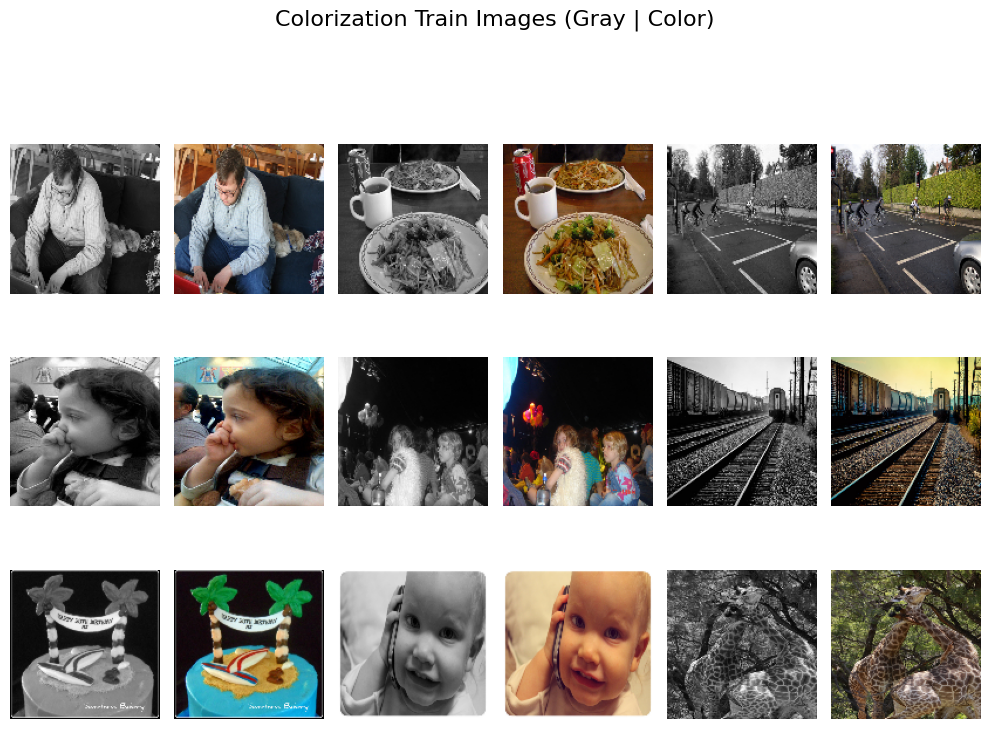

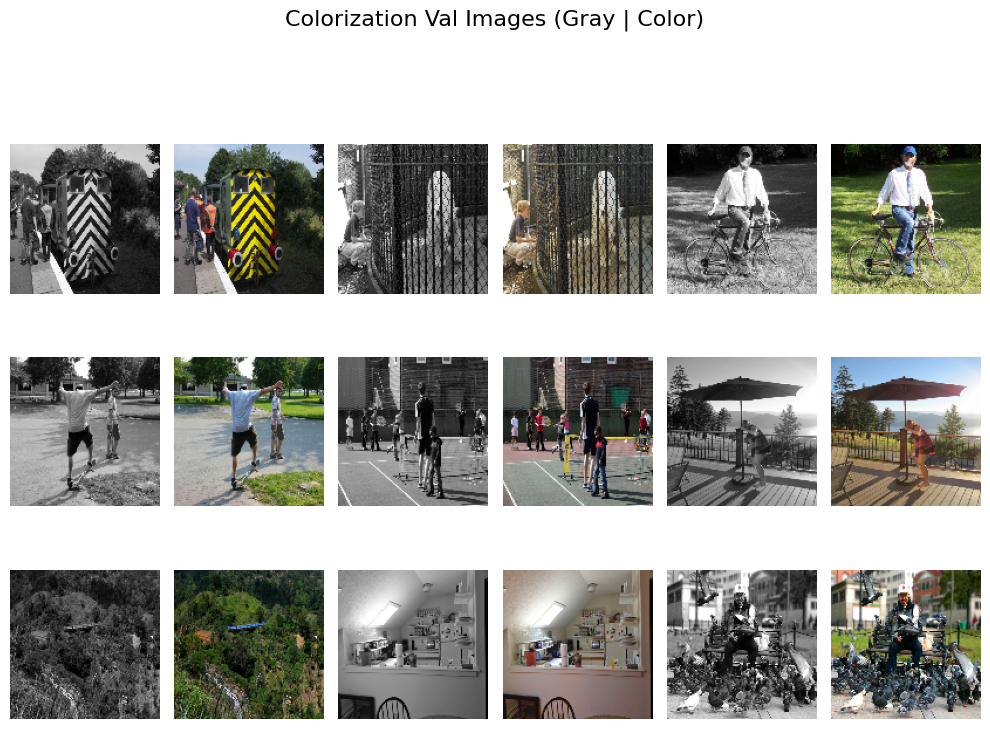

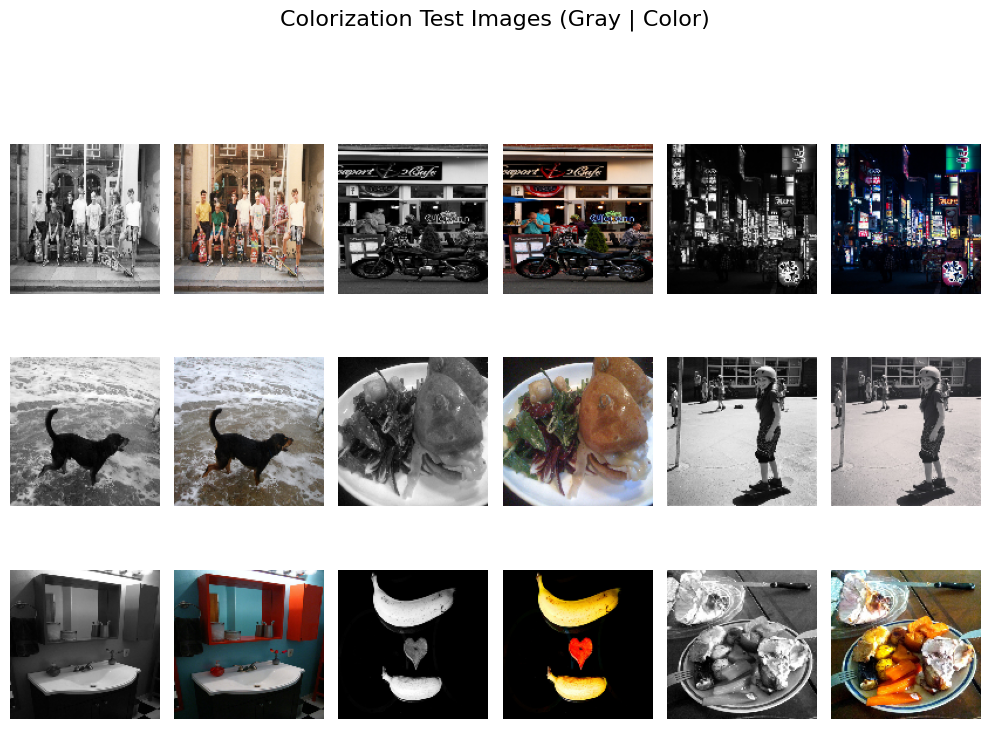

In [5]:
splits = ["train", "val", "test"]

for split_name in splits:
    gray_dir = os.path.join(COLOR_SPLIT_DIRS[split_name], "gray")
    color_dir = os.path.join(COLOR_SPLIT_DIRS[split_name], "color")

    # Get first 9 images
    image_files = sorted(os.listdir(color_dir))[:9]

    # Read gray and color images
    gray_images = [cv2.resize(cv2.imread(os.path.join(gray_dir, f), cv2.IMREAD_GRAYSCALE), (128,128))
                   for f in image_files]
    color_images = [cv2.resize(cv2.imread(os.path.join(color_dir, f)), (128,128))
                    for f in image_files]

    # Plot
    plt.figure(figsize=(10, 8))
    plt.suptitle(f"Colorization {split_name.capitalize()} Images (Gray | Color)", fontsize=16)

    for i in range(9):
        # Gray image
        plt.subplot(3, 6, 2*i+1)  # 2 columns per image
        plt.imshow(gray_images[i], cmap='gray')
        plt.axis('off')

        # Color image (BGR -> RGB)
        plt.subplot(3, 6, 2*i+2)
        plt.imshow(cv2.cvtColor(color_images[i], cv2.COLOR_BGR2RGB))
        plt.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Preprocessing
 -  Resize to ensure width and height are divisible by 8
 -  Prepare resized 3 channel img, SD expects 3 channels


(StableDiffusion requirements)

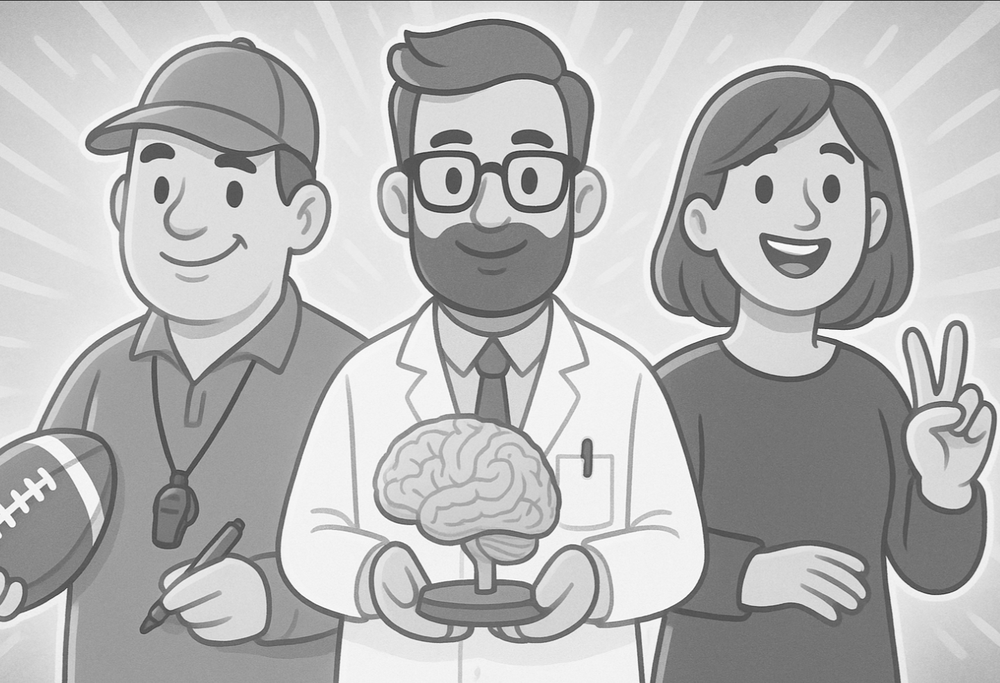

In [16]:

# Prepare resized 3 channel img
colorize_test_image = Image.open(colorize_image_path).convert("RGB")
# Image resize
width, height = colorize_test_image.size
new_width = width - (width % 8)
new_height = height - (height % 8)
image_resized = colorize_test_image.resize((new_width, new_height))

display(image_resized)

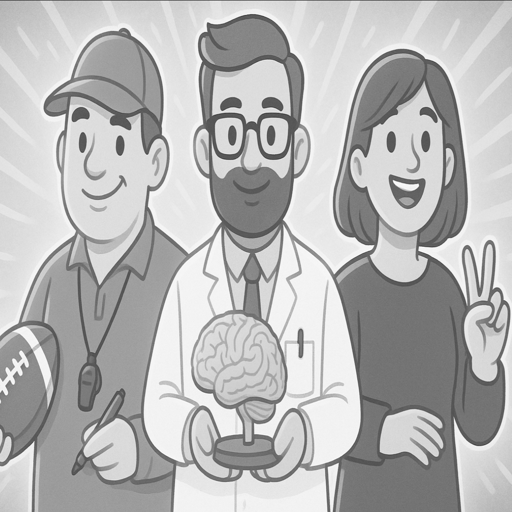

In [17]:
# Smaller resize for faster image processing
def preprocess_image(img: Image.Image) -> Image.Image:
    """
    Converts image to grayscale and resizes to 512x512 for Stable Diffusion.
    Converts back to RGB to match model input channels.
    """
    img = img.convert("L")  # Ensure img is grayscale
    img = img.resize((512, 512))
    img = img.convert("RGB")  # Revert to 3 channels
    return img

image_resized_small = preprocess_image(image_resized)
display(image_resized_small)


# Colorization Base model pipeline image:

In [28]:
# -------------------------
# Model 3. Image Colorization
# -------------------------
colorizer_base_model = "runwayml/stable-diffusion-v1-5"
# Load Base Model Pipeline - SD-1-5
colorizer_base_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    colorizer_base_model,
)
IMG_SIZE = (512, 512)   # Resolution must be divisible by 8 (SD requirement)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
# Check pipeline components, confirming No image encoder was loaded for base model
print("Feature extractor:", colorizer_base_pipe.feature_extractor)
print("Image encoder:", getattr(colorizer_base_pipe, "image_encoder", None))

Feature extractor: CLIPImageProcessor {
  "crop_size": {
    "height": 224,
    "width": 224
  },
  "do_center_crop": true,
  "do_convert_rgb": true,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.48145466,
    0.4578275,
    0.40821073
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_std": [
    0.26862954,
    0.26130258,
    0.27577711
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

Image encoder: None


## Colorize test image with base pipeline

  0%|          | 0/35 [00:00<?, ?it/s]

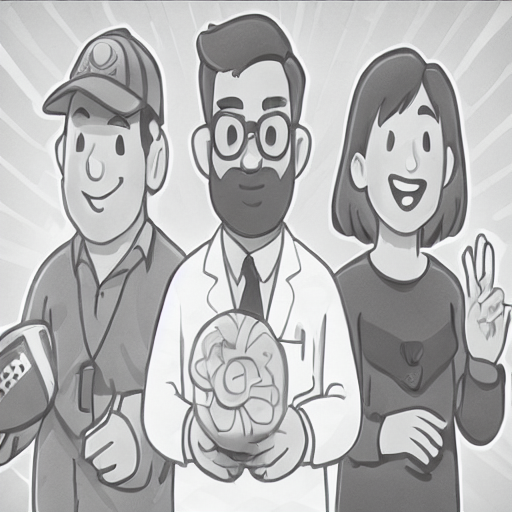

In [ ]:
# Colorizer prompt
color_prompt = """
Add realistic colors to the input image.
Preserve original image structure, objects, things, faces and shading.
"""

# Original
# Run colorization on the resized image
output = colorizer_base_pipe(
    prompt=color_prompt, # Text prompt
    image=image_resized_small, # Source img resized
    strength=0.35,  # (Default 0.8)  Lower strength (0–0.3 = preserves most of the input image) High strength (0.7–1.0 = mostly generated from scratch)
    num_inference_steps= 100,  # (50 default) Number of denoising steps for generation (more steps = finer details, but slower) num_inf_steps x strength = effective steps
    guidance_scale=7.5, # (Default 7.5) How strongly the model follows the prompt (higher = more adherence) Low 1-3, high 15-30+
    ).images[0]

display(output)
output.save("/content/drive/MyDrive/AAI-521 Final Project/test_images/output_colorize_demo_base_testimg.png")

  0%|          | 0/55 [00:00<?, ?it/s]

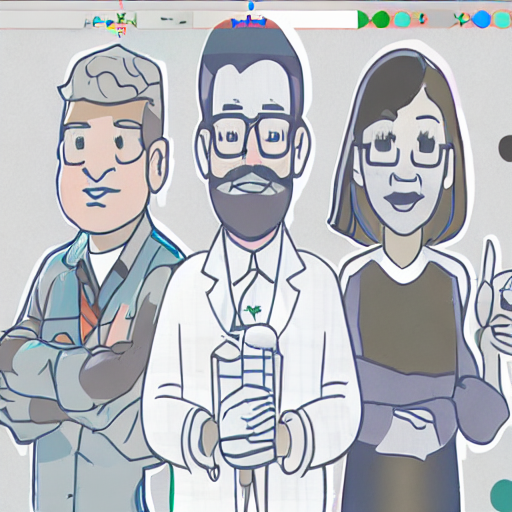

In [41]:
# Run colorization on the resized image
output = colorizer_base_pipe(
    prompt=color_prompt, # Text prompt
    image=image_resized_small, # Source img resized
    generator=torch.manual_seed(42), # Seed for repeatability
    strength=0.55,  # (Default 0.8)  Lower strength (0–0.3 = preserves most of the input image) High strength (0.7–1.0 = mostly generated from scratch)
    num_inference_steps= 100,  # (50 default) Number of denoising steps for generation (more steps = finer details, but slower) num_inf_steps x strength = effective steps
    guidance_scale=8.5,# (Default 7.5) How strongly the model follows the prompt (higher = more adherence) Low 1-3, high 15-30+
    negative_prompt="grayscale, sepia",
    ).images[0]

display(output)
output.save("/content/drive/MyDrive/AAI-521 Final Project/test_images/output_colorize_demo_base_testimg.png")

  0%|          | 0/35 [00:00<?, ?it/s]

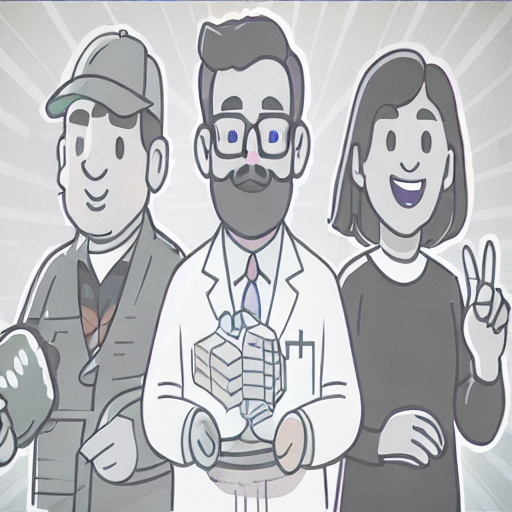

In [56]:
# Run colorization on the resized image
output = colorizer_base_pipe(
    prompt=color_prompt, # Text prompt
    image=image_resized_small, # Source img resized
    generator=torch.manual_seed(42), # Seed for repeatability
    strength=0.35,  # (Default 0.8)  Lower strength (0–0.3 = preserves most of the input image) High strength (0.7–1.0 = mostly generated from scratch)
    num_inference_steps= 100,  # (50 default) Number of denoising steps for generation (more steps = finer details, but slower) num_inf_steps x strength = effective steps
    guidance_scale=20,# (Default 7.5) How strongly the model follows the prompt (higher = more adherence) Low 1-3, high 15-30+
    negative_prompt="grayscale, sepia",
    ).images[0]

display(output)
output.save("/content/drive/MyDrive/AAI-521 Final Project/test_images/output_colorize_demo_base_testimg.png")

# Colorizer Dataset Preparation
-  Create HF DS for fine tuning

In [ ]:
transform = T.Compose([
    T.Resize((512, 512)),        # match training size
    T.ToTensor(),                 # convert to [0,1] tensor
])

class ColorizationDataset(Dataset):
    def __init__(self, gray_dir, color_dir, transform=None):
        self.gray_files = sorted(os.listdir(gray_dir))
        self.color_files = sorted(os.listdir(color_dir))
        self.gray_dir = gray_dir
        self.color_dir = color_dir
        self.transform = transform

    def __len__(self):
        return len(self.gray_files)

    def __getitem__(self, idx):
        gray_img = Image.open(os.path.join(self.gray_dir, self.gray_files[idx])).convert("RGB")
        color_img = Image.open(os.path.join(self.color_dir, self.color_files[idx])).convert("RGB")

        if self.transform:
            gray_img = self.transform(gray_img)
            color_img = self.transform(color_img)

        return {"gray": gray_img, "color": color_img}

train_dataset = ColorizationDataset(
    os.path.join(COLORIZER_DATA_ROOT, "train", "gray"),
    os.path.join(COLORIZER_DATA_ROOT, "train", "color"),
    transform=transform
)

val_dataset = ColorizationDataset(
    os.path.join(COLORIZER_DATA_ROOT, "val", "gray"),
    os.path.join(COLORIZER_DATA_ROOT, "val", "color"),
    transform=transform
)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=2)


# Preparing UNet for LoRA

Identifies attention layers in the UNet.

Created a LoRAAttnProcessor for each layer.

Attached processors to the UNet, ensuring counts matched.

In [ ]:
# 1. Define the LoraConfig
lora_config = LoraConfig(
    r=8,
    lora_alpha=8,
    target_modules=["to_q", "to_k", "to_v", "to_out.0"],
    init_lora_weights="gaussian"
)

# 2. Wrap the UNet with PEFT's get_peft_model
colorizer_base_pipe.unet = get_peft_model(colorizer_base_pipe.unet, lora_config)

# 3. Print trainable parameters
colorizer_base_pipe.unet.print_trainable_parameters()
print("UNet is LoRA-ready with PEFT.")
# --- END MODIFIED LoRA SETUP ---

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


trainable params: 1,594,368 || all params: 861,115,332 || trainable%: 0.1852
UNet is LoRA-ready with PEFT.


# Colorizer -  Fine tune UNet weights with LoRA

In [ ]:
# Move models to device
device = "cuda" if torch.cuda.is_available() else "cpu"
unet = colorizer_base_pipe.unet.to(device)
vae = colorizer_base_pipe.vae.to(device)
text_encoder = colorizer_base_pipe.text_encoder.to(device)
unet.train()
vae.eval()
text_encoder.eval()

# Optimizer and loss fn
optimizer = torch.optim.AdamW(unet.parameters(), lr=1e-4)
criterion = nn.MSELoss()

num_epochs = 10
train_losses, val_losses = [], []
train_psnrs, val_psnrs = [], []
train_ssims, val_ssims = [], []
train_fids, val_fids = [], []

# Initialize FID metrics
fid_train = FrechetInceptionDistance(feature=64).to(device)
fid_val = FrechetInceptionDistance(feature=64).to(device)

# Early stopping setup
patience = 2
bad_epochs = 0
best_val_loss = float("inf")

for epoch in range(num_epochs):
    train_loss, psnr_list_train, ssim_list_train = 0, [], []
    fid_train.reset()

    # --- Training ---
    for batch in tqdm(train_loader, desc=f"Train Epoch {epoch+1}"):
        x = batch["gray"].to(device)
        y = batch["color"].to(device)
        B = x.size(0)

        optimizer.zero_grad()

        with torch.no_grad():
            x_latent = vae.encode(x).latent_dist.sample() * 0.18215
            y_latent = vae.encode(y).latent_dist.sample() * 0.18215

        encoder_hidden_states = None
        if hasattr(colorizer_base_pipe, "text_encoder"):
            input_ids = colorizer_base_pipe.tokenizer(
                [color_prompt]*B, return_tensors="pt",
                padding="max_length", truncation=True
            ).input_ids.to(device)
            with torch.no_grad():
                encoder_hidden_states = text_encoder(input_ids)[0]

        timestep = torch.tensor([1]*B, device=device)
        pred_latent = unet(x_latent, timestep=timestep, encoder_hidden_states=encoder_hidden_states).sample

        loss = criterion(pred_latent, y_latent)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * B

        # Decode images for metrics
        pred_rgb = vae.decode(pred_latent / 0.18215).sample.clamp(0,1)
        y_rgb = y / 255.0

        # Convert to uint8 for FID
        pred_rgb_uint8 = (pred_rgb * 255).to(torch.uint8)
        y_rgb_uint8 = (y_rgb * 255).to(torch.uint8)

        # Update FID
        fid_train.update(pred_rgb_uint8, real=False)
        fid_train.update(y_rgb_uint8, real=True)

        for i in range(B):
            pred_img = pred_rgb[i].permute(1,2,0).detach().cpu().numpy()
            target_img = y_rgb[i].permute(1,2,0).detach().cpu().numpy()
            psnr_list_train.append(psnr(target_img, pred_img, data_range=1.0))
            ssim_list_train.append(ssim(target_img, pred_img, channel_axis=-1, data_range=1.0))

    # Average train metrics
    train_loss /= len(train_loader.dataset)
    train_psnrs.append(sum(psnr_list_train)/len(psnr_list_train))
    train_ssims.append(sum(ssim_list_train)/len(ssim_list_train))
    train_fids.append(fid_train.compute().item())
    train_losses.append(train_loss)

    # --- Validation ---
    val_loss, psnr_list_val, ssim_list_val = 0, [], []
    fid_val.reset()
    unet.eval()
    with torch.no_grad():
        for batch in val_loader:
            x = batch["gray"].to(device)
            y = batch["color"].to(device)
            B = x.size(0)

            x_latent = vae.encode(x).latent_dist.sample() * 0.18215
            y_latent = vae.encode(y).latent_dist.sample() * 0.18215

            encoder_hidden_states = None
            if hasattr(colorizer_base_pipe, "text_encoder"):
                input_ids = colorizer_base_pipe.tokenizer(
                    [color_prompt]*B, return_tensors="pt",
                    padding="max_length", truncation=True
                ).input_ids.to(device)
                encoder_hidden_states = text_encoder(input_ids)[0]

            timestep = torch.tensor([1]*B, device=device)
            pred_latent = unet(x_latent, timestep=timestep, encoder_hidden_states=encoder_hidden_states).sample

            val_loss += criterion(pred_latent, y_latent).item() * B

            pred_rgb = vae.decode(pred_latent / 0.18215).sample.clamp(0,1)
            y_rgb = y / 255.0

            pred_rgb_uint8 = (pred_rgb * 255).to(torch.uint8)
            y_rgb_uint8 = (y_rgb * 255).to(torch.uint8)

            fid_val.update(pred_rgb_uint8, real=False)
            fid_val.update(y_rgb_uint8, real=True)

            for i in range(B):
                pred_img = pred_rgb[i].permute(1,2,0).detach().cpu().numpy()
                target_img = y_rgb[i].permute(1,2,0).detach().cpu().numpy()
                psnr_list_val.append(psnr(target_img, pred_img, data_range=1.0))
                ssim_list_val.append(ssim(target_img, pred_img, channel_axis=-1, data_range=1.0))

    val_loss /= len(val_loader.dataset)
    val_losses.append(val_loss)
    val_psnr = sum(psnr_list_val)/len(psnr_list_val)
    val_ssim = sum(ssim_list_val)/len(ssim_list_val)
    val_fid_score = fid_val.compute().item()
    val_psnrs.append(val_psnr)
    val_ssims.append(val_ssim)
    val_fids.append(val_fid_score)
    unet.train()

    print(f"--- Epoch {epoch+1}/{num_epochs} ---"
          f"\nTrain Loss: {train_loss:.4f}, PSNR: {train_psnrs[-1]:.2f}, SSIM: {train_ssims[-1]:.4f}, FID: {train_fids[-1]:.2f} | "
          f"\nVal Loss: {val_loss:.4f}, PSNR: {val_psnrs[-1]:.2f}, SSIM: {val_ssims[-1]:.4f}, FID: {val_fids[-1]:.2f}\n")

    # Early stopping & save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        bad_epochs = 0
        torch.save(colorizer_base_pipe.unet.state_dict(), os.path.join(FINE_COLOR_MODEL_SAVE_DIR, "best_unet.pth"))
        print("Saved best model.")
    else:
        bad_epochs += 1
        if bad_epochs >= patience:
            print(f"Early stopping triggered at epoch {epoch+1}.")
            break


Train Epoch 1: 100%|██████████| 525/525 [32:49<00:00,  3.75s/it]



--- Epoch 1/10 ---
Train Loss: 0.2225, PSNR: 9.69, SSIM: 0.1057, FID: 65.94 | 
Val Loss: 0.1411, PSNR: 7.62, SSIM: 0.0330, FID: 61.80
Saved best model.


Train Epoch 2: 100%|██████████| 525/525 [05:48<00:00,  1.51it/s]



--- Epoch 2/10 ---
Train Loss: 0.1280, PSNR: 7.37, SSIM: 0.0420, FID: 61.54 | 
Val Loss: 0.1314, PSNR: 7.36, SSIM: 0.0364, FID: 60.66
Saved best model.


Train Epoch 3: 100%|██████████| 525/525 [06:38<00:00,  1.32it/s]



--- Epoch 3/10 ---
Train Loss: 0.1225, PSNR: 7.27, SSIM: 0.0473, FID: 60.58 | 
Val Loss: 0.1283, PSNR: 7.38, SSIM: 0.0439, FID: 61.42
Saved best model.


Train Epoch 4: 100%|██████████| 525/525 [06:12<00:00,  1.41it/s]



--- Epoch 4/10 ---
Train Loss: 0.1197, PSNR: 7.26, SSIM: 0.0492, FID: 60.35 | 
Val Loss: 0.1249, PSNR: 7.41, SSIM: 0.0445, FID: 55.94
Saved best model.


Train Epoch 5: 100%|██████████| 525/525 [06:38<00:00,  1.32it/s]



--- Epoch 5/10 ---
Train Loss: 0.1173, PSNR: 7.31, SSIM: 0.0512, FID: 60.28 | 
Val Loss: 0.1242, PSNR: 7.53, SSIM: 0.0574, FID: 59.80
Saved best model.


Train Epoch 6: 100%|██████████| 525/525 [06:40<00:00,  1.31it/s]



--- Epoch 6/10 ---
Train Loss: 0.1145, PSNR: 7.31, SSIM: 0.0525, FID: 60.34 | 
Val Loss: 0.1215, PSNR: 7.20, SSIM: 0.0345, FID: 62.25
Saved best model.


Train Epoch 7: 100%|██████████| 525/525 [05:46<00:00,  1.52it/s]



--- Epoch 7/10 ---
Train Loss: 0.1117, PSNR: 7.31, SSIM: 0.0496, FID: 60.46 | 
Val Loss: 0.1200, PSNR: 7.44, SSIM: 0.0403, FID: 59.73
Saved best model.


Train Epoch 8: 100%|██████████| 525/525 [05:48<00:00,  1.51it/s]



--- Epoch 8/10 ---
Train Loss: 0.1099, PSNR: 7.31, SSIM: 0.0510, FID: 60.57 | 
Val Loss: 0.1184, PSNR: 7.43, SSIM: 0.0470, FID: 60.29
Saved best model.


Train Epoch 9: 100%|██████████| 525/525 [05:46<00:00,  1.51it/s]



--- Epoch 9/10 ---
Train Loss: 0.1081, PSNR: 7.32, SSIM: 0.0516, FID: 60.72 | 
Val Loss: 0.1186, PSNR: 7.32, SSIM: 0.0405, FID: 58.68


Train Epoch 10: 100%|██████████| 525/525 [04:55<00:00,  1.78it/s]



--- Epoch 10/10 ---
Train Loss: 0.1058, PSNR: 7.32, SSIM: 0.0518, FID: 60.80 | 
Val Loss: 0.1189, PSNR: 7.38, SSIM: 0.0493, FID: 60.32
Early stopping triggered at epoch 10.


## Fine tuned colorizer - Train and Val performance plots
## Average value per epoch
- (Train and Val learning curves VAL: FID, PSNR,
<br>Loss (MSE) – averages the squared difference between predicted and target pixel intensities. Squaring penalizes larger mistakes more heavily, making the metric sensitive to bigger visual errors.
<br> 0 means perfect reconstruction; larger values indicate greater pixel-level deviation.

PSNR is a logarithmic measure of signal-to-noise (higher = less error). Derived from pixel-wise MSE.
<br>Higher PSNR → predicted pixels are closer to true pixels. >30 dB usually means good fidelity.

SSIM captures perceptual/structural similarity rather than raw pixel error. Measures similarity of local structures, contrast, and luminance between predicted and true pixels.
<br> 1 → predicted pixels perfectly preserve structures of true pixels. >0.8 → visually plausible.

FID compares distributions of generated vs real images, so it captures realism beyond pixel-wise accuracy.Measures distance between distributions of predicted vs true images in feature space (not pixel-wise).
<br> 0 → predicted pixel patterns perfectly match true image distribution. Lower → more realistic predictions.

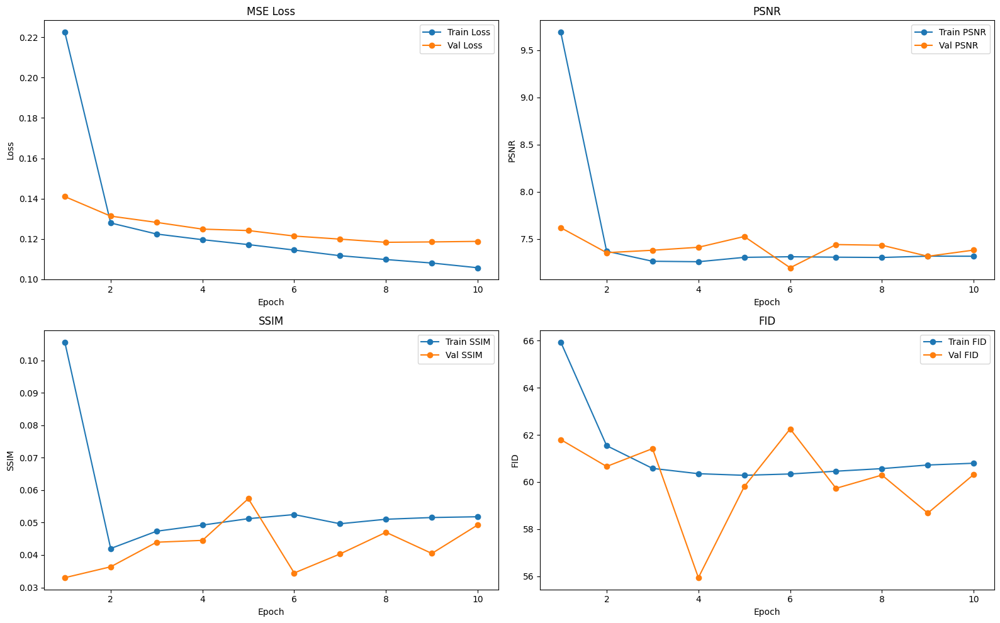

In [ ]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses)+1)
plt.figure(figsize=(16,10))

# Loss
plt.subplot(2,2,1)
plt.plot(epochs_range, train_losses, marker='o', label='Train Loss')
plt.plot(epochs_range, val_losses, marker='o', label='Val Loss')
plt.title("MSE Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# PSNR
plt.subplot(2,2,2)
plt.plot(epochs_range, train_psnrs, marker='o', label='Train PSNR')
plt.plot(epochs_range, val_psnrs, marker='o', label='Val PSNR')
plt.title("PSNR")
plt.xlabel("Epoch")
plt.ylabel("PSNR")
plt.legend()

# SSIM
plt.subplot(2,2,3)
plt.plot(epochs_range, train_ssims, marker='o', label='Train SSIM')
plt.plot(epochs_range, val_ssims, marker='o', label='Val SSIM')
plt.title("SSIM")
plt.xlabel("Epoch")
plt.ylabel("SSIM")
plt.legend()

# FID
plt.subplot(2,2,4)
plt.plot(epochs_range, train_fids, marker='o', label='Train FID')
plt.plot(epochs_range, val_fids, marker='o', label='Val FID')
plt.title("FID")
plt.xlabel("Epoch")
plt.ylabel("FID")
plt.legend()

plt.tight_layout()
plt.show()


## Colorizer -  Building FT Pipeline from UNet checkpoint and base pipeline

In [ ]:
# ---------------------------
# Save fine tuned Unet pipeline
# ---------------------------

# Load checkpoint Unet
best_unet_state = torch.load(color_ckpt_path, map_location="cpu")

# Remove "base_model.model." from the Unet dictionary keys to enable UNet Loading
clean_state = {k.replace("base_model.model.", ""): v for k, v in best_unet_state.items()}

# Apply fine-tuned UNet to base pipeline
colorizer_base_pipe.unet.load_state_dict(clean_state, strict=False)
print("Loaded best UNet successfully.")

# Save updated pipeline (feature_extractor,vae text_encoder, tokenizer, scheduler, etc.)
colorizer_base_pipe.save_pretrained(COLOR_FINE_PIPELINE_DIR)

print(f"Saved updated pipeline to: {COLOR_FINE_PIPELINE_DIR}")

Loaded best UNet successfully.


# Loading fine tuned pipe from directories

## Colorizer Fine tuned -  previous test image

In [8]:
# Load fine-tuned pipeline
ft_col_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "caliskate/colorizer-pipe-fine-tuned-aai521"
)

model_index.json:   0%|          | 0.00/682 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/374 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/554 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/735 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/910 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

# Test images :

Metrics: MSELoss, PSNR SSIM, FID per 4 images.
<br>2×2 subplot grid with 3 sets of images:
<br>(Ground Truth | Base Pipeline Colorization Pred | Fine-tuned Pipeline Pred)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

100%|██████████| 4/4 [00:00<00:00,  6.26it/s]


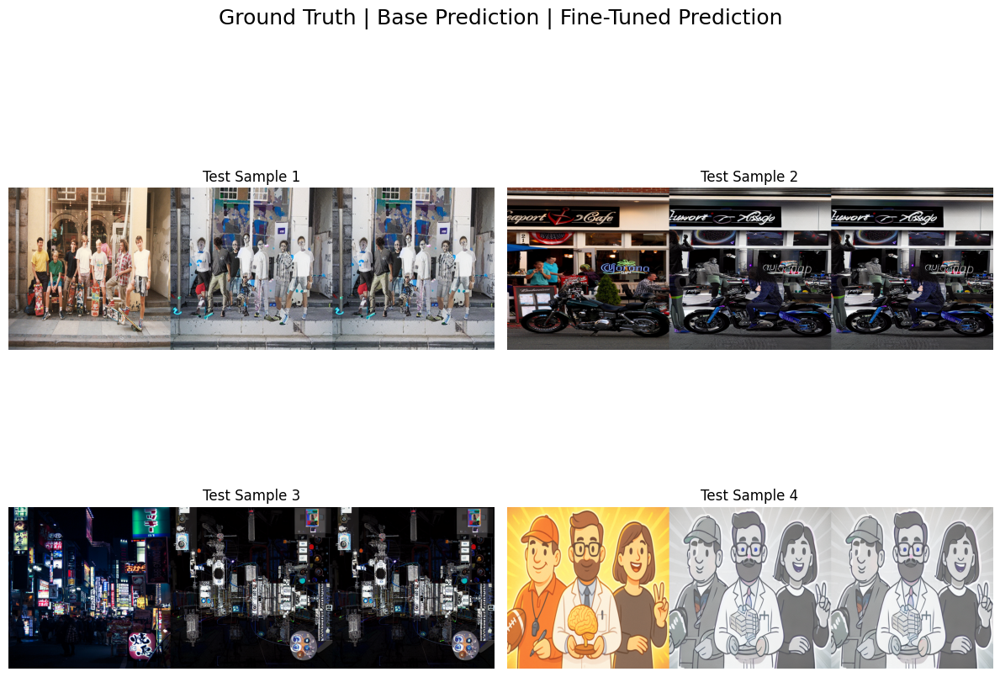


===== Colorizer Evaluation Results (4 Images per Model) =====
Base Model =>  MSE: 0.0426 | PSNR: 13.8647 | SSIM: 0.4345 | FID: 254.8776
Fine-Tuned => MSE: 0.0426 | PSNR: 13.8647 | SSIM: 0.4345 | FID: 254.8776


In [59]:
import os
import cv2
import numpy as np
import torch
from math import log10
from PIL import Image
from torchvision import transforms
from skimage.metrics import structural_similarity as ssim
from pytorch_fid import fid_score
import matplotlib.pyplot as plt
import tempfile
import shutil

# --------------------------
# SETTINGS
# --------------------------
resize_shape = (512, 512)
to_tensor = transforms.ToTensor()

def mse_loss(a, b):
    return torch.mean((a - b) ** 2).item()

def psnr(a, b):
    mse = mse_loss(a, b)
    if mse == 0:
        return 100
    return 20 * log10(1.0 / np.sqrt(mse))

def compute_ssim(gt, pred):
    gt_np = gt.permute(1, 2, 0).cpu().numpy()
    pred_np = pred.permute(1, 2, 0).cpu().numpy()
    return ssim(gt_np, pred_np, channel_axis=2, data_range=1)

def resize_before(pil_img):
    # Ensure 3-channel RGB
    if pil_img.mode != "RGB":
        pil_img = pil_img.convert("RGB")
    return pil_img.resize(resize_shape)

# --------------------------
# Load first 3 from dataset
# --------------------------
test_color_dir = os.path.join(COLOR_SPLIT_DIRS["test"], "color")
test_gray_dir = os.path.join(COLOR_SPLIT_DIRS["test"], "gray")
test_files = sorted(os.listdir(test_color_dir))[:3]

dataset_color_imgs = []
dataset_gray_imgs = []

for f in test_files:
    color_img = Image.open(os.path.join(test_color_dir, f)).convert("RGB")
    gray_img = Image.open(os.path.join(test_gray_dir, f)).convert("L")

    dataset_color_imgs.append(resize_before(color_img))
    dataset_gray_imgs.append(resize_before(gray_img).convert("RGB"))  # RGB for SD pipeline

# --------------------------
# 4th sample (CUSTOM TEST IMAGE)
# --------------------------
gray_custom = Image.open(colorize_image_path).convert("L")
gray_custom_resized = resize_before(gray_custom).convert("RGB")

true_custom_color = Image.open(true_color_image_path).convert("RGB")
true_custom_color_resized = resize_before(true_custom_color)

dataset_gray_imgs.append(gray_custom_resized)
dataset_color_imgs.append(true_custom_color_resized)

# --------------------------
# Run predictions (updated settings)
# --------------------------
def run_model(pipe, gray_images):
    preds = []
    for img in gray_images:
        output = pipe(
            prompt=color_prompt,
            image=img,
            strength=0.35,  # preserves most of input
            num_inference_steps=100,
            guidance_scale=20,  # high adherence to prompt
            negative_prompt="grayscale, sepia",
            generator=torch.manual_seed(42)  # repeatable results
        ).images[0]
        preds.append(resize_before(output))
    return preds

base_predictions = run_model(colorizer_base_pipe, dataset_gray_imgs)
ft_predictions = run_model(ft_col_pipe, dataset_gray_imgs)

# --------------------------
# Metrics Evaluation
# --------------------------
def evaluate_set(gt_imgs, pred_imgs):
    mse_scores, psnr_scores, ssim_scores = [], [], []

    for gt, pred in zip(gt_imgs, pred_imgs):
        gt_t = to_tensor(gt)
        pred_t = to_tensor(pred)

        mse_scores.append(mse_loss(gt_t, pred_t))
        psnr_scores.append(psnr(gt_t, pred_t))
        ssim_scores.append(compute_ssim(gt_t, pred_t))

    return np.mean(mse_scores), np.mean(psnr_scores), np.mean(ssim_scores)

mse_base, psnr_base, ssim_base = evaluate_set(dataset_color_imgs, base_predictions)
mse_ft, psnr_ft, ssim_ft = evaluate_set(dataset_color_imgs, ft_predictions)

# --------------------------
# Compute FID (4 per model)
# --------------------------
def compute_fid(gt_imgs, pred_imgs):
    temp_real = tempfile.mkdtemp()
    temp_fake = tempfile.mkdtemp()

    try:
        for i, (real, fake) in enumerate(zip(gt_imgs, pred_imgs)):
            real.save(os.path.join(temp_real, f"real_{i}.png"))
            fake.save(os.path.join(temp_fake, f"fake_{i}.png"))

        return fid_score.calculate_fid_given_paths(
            [temp_real, temp_fake],
            batch_size=1,
            device='cpu',
            dims=2048
        )
    finally:
        shutil.rmtree(temp_real)
        shutil.rmtree(temp_fake)

fid_base = compute_fid(dataset_color_imgs, base_predictions)
fid_ft   = compute_fid(dataset_color_imgs, ft_predictions)

# --------------------------
# SUBPLOTS (2x2 grid)
# --------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle("Ground Truth | Base Prediction | Fine-Tuned Prediction", fontsize=18)

positions = [(0,0), (0,1), (1,0), (1,1)]

for idx, ax_pos in enumerate(positions):
    row, col = ax_pos
    gt_img  = dataset_color_imgs[idx]
    base_img = base_predictions[idx]
    ft_img = ft_predictions[idx]

    combined = np.hstack([
        cv2.cvtColor(np.array(gt_img), cv2.COLOR_RGB2BGR),
        cv2.cvtColor(np.array(base_img), cv2.COLOR_RGB2BGR),
        cv2.cvtColor(np.array(ft_img), cv2.COLOR_RGB2BGR)
    ])

    axes[row][col].imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
    axes[row][col].axis("off")
    axes[row][col].set_title(f"Test Sample {idx+1}")

plt.tight_layout()
plt.show()

# --------------------------
# RESULTS
# --------------------------
print("\n===== Colorizer Evaluation Results (4 Images per Model) =====")
print(f"Base Model =>  MSE: {mse_base:.4f} | PSNR: {psnr_base:.4f} | SSIM: {ssim_base:.4f} | FID: {fid_base:.4f}")
print(f"Fine-Tuned => MSE: {mse_ft:.4f} | PSNR: {psnr_ft:.4f} | SSIM: {ssim_ft:.4f} | FID: {fid_ft:.4f}")


# 4) Inpainting fine tuning 

Installations

In [ ]:
# Check Colab virtual memory
!du -h --max-depth=1 /content

140K	/content/.config
9.8G	/content/drive
55M	/content/sample_data
9.9G	/content


In [2]:
# Upgrade pip
!pip install --upgrade pip

# Install PyTorch/XLA for TPU
!pip install torch torchvision torchaudio torch_xla --extra-index-url https://storage.googleapis.com/pytorch-tpu-releases/wheels/tpuvm/torch_xla-2.8

# Upgrade Hugging Face and other dependencies
!pip install --upgrade diffusers transformers accelerate safetensors datasets huggingface_hub peft opencv-python-headless python-dotenv

# Performance metrics
!pip install scikit-image torchmetrics[image] torch-fidelity pytorch-fid


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 30.2 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2
Looking in indexes: https://pypi.org/simple, https://storage.googleapis.com/pytorch-tpu-releases/wheels/tpuvm/torch_xla-2.8
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 MB 55.0 MB/s  0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 30.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.7/47.7 MB 52.1 MB/s  0:00:00
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 18.1.0
    Uninstalling pyarrow-18.1.0:
      Successfully uninstalled pyarrow-18.1.0
  Attempting uninstall: transformers
    Found existing installation: transformers 4.57.2
    Uninstalling transformers-4.57.2:
      Successfully uninstalled transformers-4.57.2
  Attempting uninstall: datasets
    Found existing installation: datasets 4.0.0
    Unins

In [3]:
# Verify diffusers version
import diffusers
print(diffusers.__version__)

0.35.2


Libraries

In [4]:
import torch
# Colorizer-------------------
from diffusers import StableDiffusionImg2ImgPipeline
# Inpainting ---------------
from diffusers import StableDiffusionInpaintPipeline
# ----------------------------------------
from google.colab import drive
import os
from dotenv import load_dotenv
from datasets import load_dataset
from huggingface_hub import login

# Preprocessing, data handling
from sklearn.model_selection import train_test_split

# Visualizations
import cv2
from PIL import Image, ImageDraw
from IPython.display import display
import matplotlib.pyplot as plt

# Colorizer fine tuning
from diffusers import StableDiffusionPipeline, UNet2DConditionModel, AutoencoderKL, DDPMScheduler, PNDMScheduler
from diffusers.models.attention_processor import LoRAAttnProcessor
from diffusers.optimization import get_scheduler

from transformers import CLIPTextModel, CLIPTokenizer, CLIPVisionModel, CLIPImageProcessor

from accelerate import Accelerator
from torchvision import transforms
from peft import LoraConfig, get_peft_model_state_dict, get_peft_model
from torch import nn, optim
from tqdm import tqdm

# LoRA prep
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model
# Performance metrics
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from torchmetrics.image.fid import FrechetInceptionDistance





/usr/local/lib/python3.12/dist-packages/torch_xla/__init__.py:246: UserWarning: `tensorflow` can conflict with `torch-xla`. Prefer `tensorflow-cpu` when using PyTorch/XLA. To silence this warning, `pip uninstall -y tensorflow && pip install tensorflow-cpu`. If you are in a notebook environment such as Colab or Kaggle, restart your notebook runtime afterwards.
  warnings.warn(


In [5]:
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Env file path
env_path = "/content/drive/MyDrive/AAI-521 Final Project/hf_login.env"
# Open env file
load_dotenv(env_path)
# Access token from environment
hf_key = os.getenv("HF_TOKEN")
print("HF key loaded:", hf_key is not None)

# Dataset Paths

# ------------------------------------------
# Inpainting - Dataset Paths
# ------------------------------------------

# 1) Paths for inpaint ds train/val/test img subsets
INPAINT_DATA_ROOT = "/content/drive/MyDrive/AAI-521 Final Project/inpainting_subset"
INPAINT_SPLIT_DIRS = {
    "train": os.path.join(INPAINT_DATA_ROOT, "train"),
    "val":   os.path.join(INPAINT_DATA_ROOT, "val"),
    "test":  os.path.join(INPAINT_DATA_ROOT, "test"),
}

# 2) Create ds dirs
os.makedirs(INPAINT_DATA_ROOT, exist_ok=True)
for d in INPAINT_SPLIT_DIRS.values():
    os.makedirs(d, exist_ok=True)
    os.makedirs(os.path.join(d, "masked"), exist_ok=True)
    os.makedirs(os.path.join(d, "original"), exist_ok=True)

# 3) Path to FT inpaint model
INPAINT_FINE_MODEL_SAVE_DIR = "/content/drive/MyDrive/AAI-521 Final Project/fine_tuned_models/inpainting"
# Make sure it exists
os.makedirs(INPAINT_FINE_MODEL_SAVE_DIR, exist_ok=True)

# 4) Ensure test_images folder exists
os.makedirs("/content/drive/MyDrive/AAI-521 Final Project/test_images", exist_ok=True)
# 5) inpaint test image path
inpaint_image_path = "/content/drive/MyDrive/AAI-521 Final Project/test_images/inpaint_ex1.png"
# 6) inpaint true color test image
true_color_image_path = "/content/drive/MyDrive/AAI-521 Final Project/test_images/true_color_ex1.png"


# 7) Subfolder for pipeline
# Updated - use inpainting subfolder
INPAINT_PIPELINE_DIR = os.path.join(INPAINT_FINE_MODEL_SAVE_DIR, "inpainting_pipeline")
os.makedirs(INPAINT_PIPELINE_DIR, exist_ok=True)
# 8) Inpaint checkpoint path
inpaint_ckpt_path = "/content/drive/MyDrive/AAI-521 Final Project/fine_tuned_models/inpainting/best_unet.pth"


HF key loaded: True


Load COCO dataset

In [ ]:
coco_ds = load_dataset("detection-datasets/coco")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/58.0 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

dataset_infos.json: 0.00B [00:00, ?B/s]

data/train-00000-of-00040-67e35002d15215(…):   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00001-of-00040-2c2b33b9504aa8(…):   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00002-of-00040-58e30306870b1d(…):   0%|          | 0.00/474M [00:00<?, ?B/s]

data/train-00003-of-00040-a77e00648e4239(…):   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00004-of-00040-1df1755d6f7c9b(…):   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00005-of-00040-29ccfc8f52cfc9(…):   0%|          | 0.00/473M [00:00<?, ?B/s]

data/train-00006-of-00040-76f2d663d51dca(…):   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00007-of-00040-797508421c59b9(…):   0%|          | 0.00/477M [00:00<?, ?B/s]

data/train-00008-of-00040-7ad10a6d6b442e(…):   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00009-of-00040-edc6018bb7abee(…):   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00010-of-00040-068d922af9742c(…):   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00011-of-00040-2cf010e9592da4(…):   0%|          | 0.00/483M [00:00<?, ?B/s]

data/train-00012-of-00040-e26d7a054b1f8c(…):   0%|          | 0.00/477M [00:00<?, ?B/s]

data/train-00013-of-00040-00a967ab3e2568(…):   0%|          | 0.00/476M [00:00<?, ?B/s]

data/train-00014-of-00040-4f6a348405f372(…):   0%|          | 0.00/477M [00:00<?, ?B/s]

data/train-00015-of-00040-ae8972f628750c(…):   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00016-of-00040-37711297359438(…):   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00017-of-00040-e2f542f29ca613(…):   0%|          | 0.00/477M [00:00<?, ?B/s]

data/train-00018-of-00040-3650ae2c12a832(…):   0%|          | 0.00/474M [00:00<?, ?B/s]

data/train-00019-of-00040-f262669c6302eb(…):   0%|          | 0.00/476M [00:00<?, ?B/s]

data/train-00020-of-00040-d2763ce5e7ab09(…):   0%|          | 0.00/486M [00:00<?, ?B/s]

data/train-00021-of-00040-fb98d35ab4e6ca(…):   0%|          | 0.00/482M [00:00<?, ?B/s]

data/train-00022-of-00040-c4f90a7435af52(…):   0%|          | 0.00/487M [00:00<?, ?B/s]

data/train-00023-of-00040-31db5fa16e24d3(…):   0%|          | 0.00/477M [00:00<?, ?B/s]

data/train-00024-of-00040-786ee9123ad04e(…):   0%|          | 0.00/476M [00:00<?, ?B/s]

data/train-00025-of-00040-369c096f8c7d7a(…):   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00026-of-00040-709cf1a409a269(…):   0%|          | 0.00/470M [00:00<?, ?B/s]

data/train-00027-of-00040-c99041dbf75151(…):   0%|          | 0.00/482M [00:00<?, ?B/s]

data/train-00028-of-00040-5e11f3d596cb0d(…):   0%|          | 0.00/480M [00:00<?, ?B/s]

data/train-00029-of-00040-988997614786b5(…):   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00030-of-00040-497df2d4082da4(…):   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00031-of-00040-541a6ccf9f2109(…):   0%|          | 0.00/476M [00:00<?, ?B/s]

data/train-00032-of-00040-659aee4f72e8f5(…):   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00033-of-00040-0074f368f67338(…):   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00034-of-00040-edcd109018ecaf(…):   0%|          | 0.00/481M [00:00<?, ?B/s]

data/train-00035-of-00040-c8fd4fb1bb9311(…):   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00036-of-00040-5d6d294fbed2af(…):   0%|          | 0.00/478M [00:00<?, ?B/s]

data/train-00037-of-00040-cb1276b8824445(…):   0%|          | 0.00/479M [00:00<?, ?B/s]

data/train-00038-of-00040-15a5fd14791741(…):   0%|          | 0.00/482M [00:00<?, ?B/s]

data/train-00039-of-00040-f1a97fa690638b(…):   0%|          | 0.00/474M [00:00<?, ?B/s]

data/val-00000-of-00002-c4f2e391ee4aba11(…):   0%|          | 0.00/404M [00:00<?, ?B/s]

data/val-00001-of-00002-7af5414a3b178949(…):   0%|          | 0.00/404M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/117266 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/4952 [00:00<?, ? examples/s]

Loading dataset shards:   0%|          | 0/20 [00:00<?, ?it/s]

In [ ]:
# # Full COCO dataset
coco_ds

DatasetDict({
    train: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 117266
    })
    val: Dataset({
        features: ['image_id', 'image', 'width', 'height', 'objects'],
        num_rows: 4952
    })
})

In [ ]:
# Check Colab virtual memory
!du -h --max-depth=1 /content

140K	/content/.config
11G	/content/drive
55M	/content/sample_data
11G	/content


# Filter COCO ds for 1500 color images

In [ ]:
# Confirm color
def is_color(pil_img):
    if pil_img.mode != "RGB":
        return False
    r, g, b = pil_img.split()
    return not (r == g == b)

color_images = []
max_needed = 1500

# Only use existing splits: train and val
for split in ["train", "val"]:
    for row in coco_ds[split]:

        img = row["image"]  # already a PIL image

        try:
            img = img.convert("RGB")
        except:
            continue

        if not is_color(img):
            continue

        color_images.append(img)

        if len(color_images) >= max_needed:
            break

    if len(color_images) >= max_needed:
        break

len(color_images)

1500

# Create Mask Pairs

In [ ]:
import numpy as np
from PIL import Image, ImageDraw
import random

def apply_rectangle_mask(img, max_area_frac=0.25, max_rects=3):
    w, h = img.size
    mask = Image.new("L", (w, h), 0)
    draw = ImageDraw.Draw(mask)

    for _ in range(random.randint(1, max_rects)):
        area = random.uniform(0.02, max_area_frac)
        rect_w = int(w * (area ** 0.5) * random.uniform(0.5, 1.5))
        rect_h = int(h * (area ** 0.5) * random.uniform(0.5, 1.5))

        x1 = random.randint(0, max(0, w - rect_w))
        y1 = random.randint(0, max(0, h - rect_h))

        draw.rectangle([x1, y1, x1 + rect_w, y1 + rect_h], fill=255)

    # apply mask
    masked = img.copy()
    arr = np.array(masked)
    mask_np = np.array(mask)
    arr[mask_np == 255] = 0  # black masked pixels

    return Image.fromarray(arr), mask

# -----------------------------------------
# Create (masked_img, original_img) pairs
# -----------------------------------------
pairs = []

for img in color_images:
    original = img.resize(IMG_SIZE, resample=Image.LANCZOS)

    masked, _ = apply_rectangle_mask(original)

    pairs.append((masked, original))

print(len(pairs))
print('Splitting datasets for train, val, test...')

train_pairs, temp_pairs = train_test_split(pairs, test_size=0.30, random_state=42)
val_pairs, test_pairs   = train_test_split(temp_pairs, test_size=0.50, random_state=42)

print(f"Dataset images count (train/val/test): {len(train_pairs), len(val_pairs), len(test_pairs)}")

# -----------------------------------------
# Save images
# -----------------------------------------
print('Saving images (train/val/test)...')

for split_name, split_pairs in [
    ("train", train_pairs),
    ("val", val_pairs),
    ("test", test_pairs),
]:
    out_dir = INPAINT_SPLIT_DIRS[split_name]

    masked_dir = os.path.join(out_dir, "masked")
    orig_dir   = os.path.join(out_dir, "original")

    os.makedirs(masked_dir, exist_ok=True)
    os.makedirs(orig_dir, exist_ok=True)

    for i, (masked_img, original_img) in enumerate(split_pairs):
        masked_img.save(os.path.join(masked_dir, f"{i:05d}.png"))
        original_img.save(os.path.join(orig_dir, f"{i:05d}.png"))


1500
Splitting datasets for train, val, test...
Dataset images count (train/val/test): (1050, 225, 225)
Saving images (train/val/test)...


# Visualize mask pairs

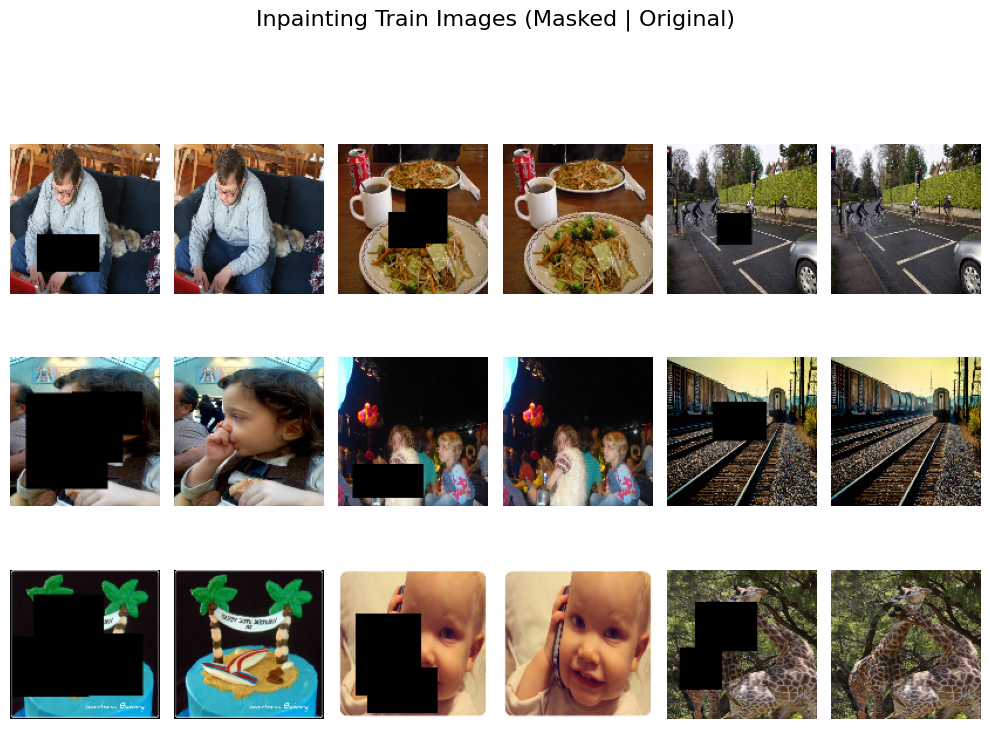

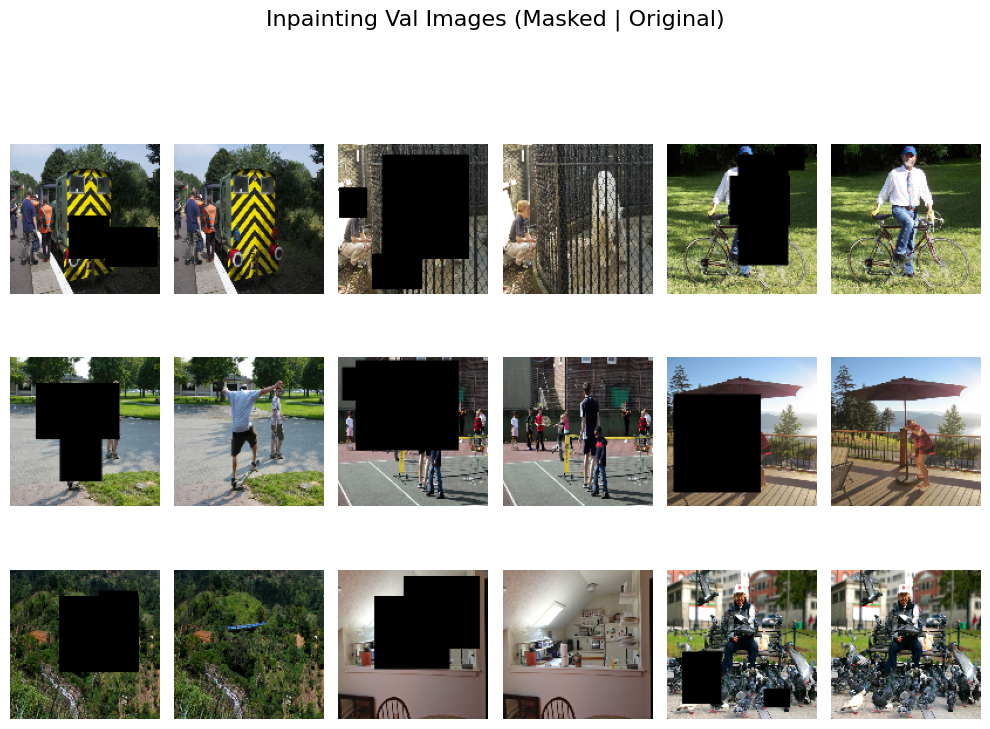

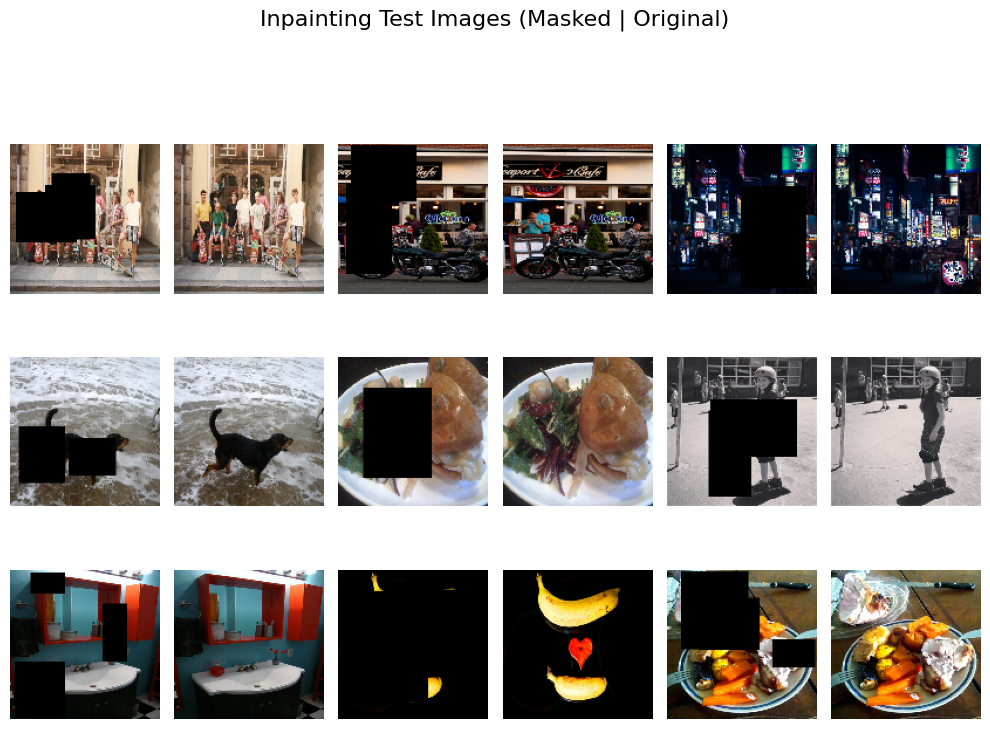

In [ ]:
splits = ["train", "val", "test"]

for split_name in splits:
    masked_dir = os.path.join(INPAINT_SPLIT_DIRS[split_name], "masked")
    orig_dir   = os.path.join(INPAINT_SPLIT_DIRS[split_name], "original")

    # First 9 images
    image_files = sorted(os.listdir(orig_dir))[:9]

    # Load & resize
    masked_images = [
        cv2.resize(cv2.imread(os.path.join(masked_dir, f)), (128,128))
        for f in image_files
    ]
    orig_images = [
        cv2.resize(cv2.imread(os.path.join(orig_dir, f)), (128,128))
        for f in image_files
    ]

    # Plot
    plt.figure(figsize=(10, 8))
    plt.suptitle(f"Inpainting {split_name.capitalize()} Images (Masked | Original)", fontsize=16)

    for i in range(9):
        # Masked image
        plt.subplot(3, 6, 2*i+1)
        plt.imshow(cv2.cvtColor(masked_images[i], cv2.COLOR_BGR2RGB))
        plt.axis('off')

        # Original
        plt.subplot(3, 6, 2*i+2)
        plt.imshow(cv2.cvtColor(orig_images[i], cv2.COLOR_BGR2RGB))
        plt.axis('off')

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


# Test - verify mask region detection from masked image dataset

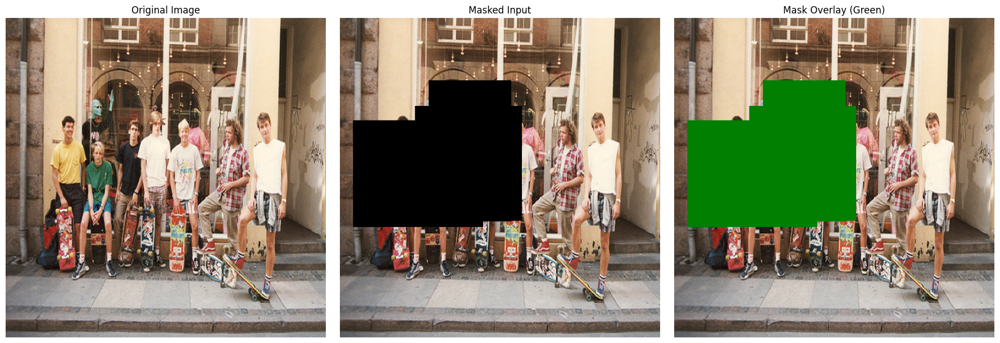

In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# --------------------------
# SETTINGS
# --------------------------
resize_shape = (512, 512)

def resize_before(pil_img):
    if pil_img.mode != "RGB":
        pil_img = pil_img.convert("RGB")
    return pil_img.resize(resize_shape)

# --------------------------
# LOAD ONE TEST IMAGE AND MASK
# --------------------------
test_mask_dir = os.path.join(INPAINT_SPLIT_DIRS["test"], "masked")
test_orig_dir = os.path.join(INPAINT_SPLIT_DIRS["test"], "original")
test_files = sorted(os.listdir(test_mask_dir))[:1]  # just one image

orig = Image.open(os.path.join(test_orig_dir, test_files[0])).convert("RGB")
masked = Image.open(os.path.join(test_mask_dir, test_files[0])).convert("RGB")

orig_resized = resize_before(orig)
masked_resized = resize_before(masked)

# --------------------------
# CREATE GREEN OVERLAY
# --------------------------
orig_arr = np.array(orig_resized)
masked_arr = np.array(masked_resized)
mask_bin = ((orig_arr != masked_arr).any(axis=2))

overlay = np.array(masked_resized).copy()
overlay[mask_bin] = [0, 255, 0]  # green

alpha = 0.5
blended = (np.array(masked_resized) * (1 - alpha) + overlay * alpha).astype(np.uint8)

# --------------------------
# DISPLAY SUBPLOTS
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(18,6))

axes[0].imshow(orig_resized)
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(masked_resized)
axes[1].set_title("Masked Input")
axes[1].axis("off")

axes[2].imshow(blended)
axes[2].set_title("Mask Overlay (Green)")
axes[2].axis("off")

plt.tight_layout()
plt.show()


# Single test run inference with base model

In [10]:
inpaint_prompt = "fill in the missing part of the image realistically"

In [ ]:
# Load base model again
inpaint_base_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    safety_checker = None # Disabled to avoid false errors with proper usage
)

- Identifies pixels where the masked image differs from the original.

- Creates a single-channel binary mask: 255 for pixels to inpaint, 0 for pixels to keep.

- Fills the masked regions in the input image with white (255,255,255)

- Prepares the filled image (RGB) and the binary mask (L mode) for input to the inpainting pipeline.

  0%|          | 0/50 [00:00<?, ?it/s]

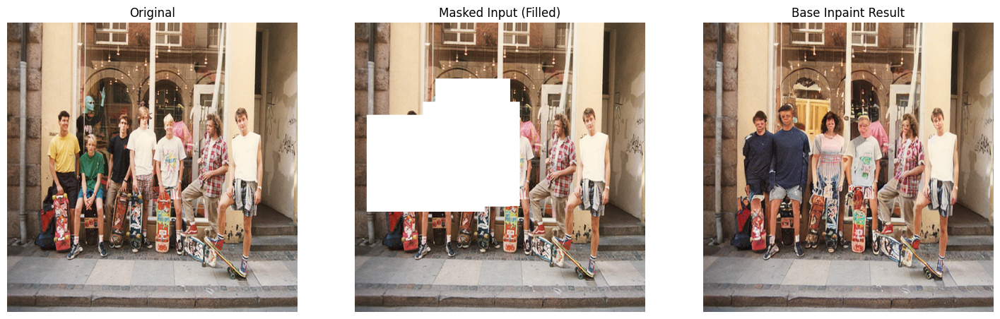

In [12]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torch

resize_shape = (512, 512)

def resize_before(pil_img):
    if pil_img.mode != "RGB":
        pil_img = pil_img.convert("RGB")
    return pil_img.resize(resize_shape)

# --------------------------
# LOAD TEST IMAGES AND MASKS
# --------------------------
test_mask_dir = os.path.join(INPAINT_SPLIT_DIRS["test"], "masked")
test_orig_dir = os.path.join(INPAINT_SPLIT_DIRS["test"], "original")
test_files = sorted(os.listdir(test_mask_dir))[:3]

dataset_masked_imgs = []
dataset_original_imgs = []
dataset_binary_masks = []

for f in test_files:
    # Load images
    orig = Image.open(os.path.join(test_orig_dir, f)).convert("RGB")
    masked = Image.open(os.path.join(test_mask_dir, f)).convert("RGB")

    orig_resized = resize_before(orig)
    masked_resized = resize_before(masked)

    dataset_original_imgs.append(orig_resized)

    # --- Create RGB mask: black background, white for inpaint ---
    masked_arr = np.array(masked_resized)
    orig_arr = np.array(orig_resized)

    # Detect different pixels in masked image
    mask_arr = ((orig_arr != masked_arr).any(axis=2)).astype(np.uint8) * 255

    # Convert to single-channel L
    binary_mask = Image.fromarray(mask_arr).convert("L")


    # Append binary_mask to the dataset_binary_mask
    dataset_binary_masks.append(binary_mask)

    # --- Fill masked area with white in the masked image ---
    masked_arr[mask_arr == 255] = [255, 255, 255]
    filled_masked_img = Image.fromarray(masked_arr)
    dataset_masked_imgs.append(filled_masked_img)

# Pick first image for demo
masked_img = dataset_masked_imgs[0]
mask_img = dataset_binary_masks[0]  # 255 = inpaint, 0 = keep
orig_img = dataset_original_imgs[0]

# ---- Run Stable Diffusion Inpainting ----
base_result = inpaint_base_pipe(
    prompt=inpaint_prompt,
    image=masked_img,
    mask_image=mask_img,
    generator=torch.manual_seed(42)
).images[0]

# --------------------------
# DISPLAY
# --------------------------
fig, axes = plt.subplots(1, 3, figsize=(18,6))
axes[0].imshow(orig_img)
axes[0].set_title("Original True Image")
axes[0].axis("off")

axes[1].imshow(masked_img)
axes[1].set_title("Masked Input (Filled with white)")
axes[1].axis("off")

axes[2].imshow(base_result)
axes[2].set_title("Base Inpaint Result")
axes[2].axis("off")

plt.show()


# Inpainting Fine tuning Dataset and UNet preparation
- train and val loader
- Inject LoRA into base pipeline UNet

In [ ]:
from torch.utils.data import Dataset
from PIL import Image
import os
import numpy as np
from torchvision import transforms as T

from diffusers import (
    StableDiffusionInpaintPipeline,
    UNet2DConditionModel,
    AutoencoderKL,
    PNDMScheduler,
)
from transformers import CLIPTextModel, CLIPTokenizer
from peft import LoraConfig, get_peft_model

# Transform for masked/original images
img_transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor(),
    T.Normalize([0.5]*3, [0.5]*3)  # scale to [-1,1] for Stable Diffusion
])

# Transform for masks
mask_transform = T.Compose([
    T.Resize((512, 512)),
    T.ToTensor()  # will convert 0/255 to 0.0/1.0
])

class InpaintingDataset(Dataset):
    def __init__(self, masked_dir, orig_dir, transform=None, mask_transform=None):
        self.masked_files = sorted(os.listdir(masked_dir))
        self.orig_files   = sorted(os.listdir(orig_dir))
        self.masked_dir = masked_dir
        self.orig_dir   = orig_dir
        self.transform = transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.masked_files)

    def __getitem__(self, idx):
        masked = Image.open(os.path.join(self.masked_dir, self.masked_files[idx])).convert("RGB")
        orig   = Image.open(os.path.join(self.orig_dir,   self.orig_files[idx])).convert("RGB")

        # auto-build binary mask from black pixels
        masked_np = np.array(masked)
        mask_np = (masked_np.sum(axis=2) == 0).astype(np.uint8)  # shape H,W

        mask_img = Image.fromarray(mask_np * 255)  # convert to PIL for transform

        if self.transform:
            masked = self.transform(masked)
            orig   = self.transform(orig)

        if self.mask_transform:
            mask = self.mask_transform(mask_img)
        else:
            mask = T.ToTensor()(mask_img)

        return {
            "masked": masked,    # 3×512×512
            "mask":   mask,      # 1×512×512 (0 or 1)
            "orig":   orig       # 3×512×512
        }
train_dataset = InpaintingDataset(
    os.path.join(INPAINT_DATA_ROOT, "train", "masked"),
    os.path.join(INPAINT_DATA_ROOT, "train", "original"),
    transform=img_transform,
    mask_transform=mask_transform
)

val_dataset = InpaintingDataset(
    os.path.join(INPAINT_DATA_ROOT, "val", "masked"),
    os.path.join(INPAINT_DATA_ROOT, "val", "original"),
    transform=img_transform,
    mask_transform=mask_transform
)

train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=2)

# ---------------------------------------------
# Base inpainting model name
# ---------------------------------------------
inpaint_base_model = "runwayml/stable-diffusion-inpainting"


# ---------------------------------------------
# Build the inpainting pipeline
# ---------------------------------------------

inpaint_base_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
)

# ---------------------------------------------
# LoRA configuration for UNet attention layers
# ---------------------------------------------
lora_config = LoraConfig(
    r=20,
    lora_alpha=20,
    target_modules=["to_q", "to_k", "to_v", "to_out.0"],
    init_lora_weights="gaussian"
)

# ---------------------------------------------
# Inject LoRA layers into the UNet
# ---------------------------------------------
inpaint_base_pipe.unet = get_peft_model(inpaint_base_pipe.unet, lora_config)

# ---------------------------------------------
# Verify trainable parameters
# ---------------------------------------------
inpaint_base_pipe.unet.print_trainable_parameters()
print("Inpainting UNet is LoRA-ready.")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


trainable params: 3,985,920 || all params: 863,521,284 || trainable%: 0.4616
Inpainting UNet is LoRA-ready.


In [ ]:
# Check pipeline components, confirming No image encoder was loaded for base model
print("Feature extractor:", inpaint_base_pipe.feature_extractor)
print("Image encoder:", getattr(inpaint_base_pipe, "image_encoder", None))

Feature extractor: CLIPImageProcessor {
  "crop_size": {
    "height": 224,
    "width": 224
  },
  "do_center_crop": true,
  "do_convert_rgb": true,
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.48145466,
    0.4578275,
    0.40821073
  ],
  "image_processor_type": "CLIPImageProcessor",
  "image_std": [
    0.26862954,
    0.26130258,
    0.27577711
  ],
  "resample": 3,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "shortest_edge": 224
  }
}

Image encoder: None


# Fine tune UNet inpainting model with LoRA
- feeding the masked image
- + mask tensor
- +  text prompt into the UNet "restore missing region"
to inpaint the masked area of the image

In [ ]:
import torch
import torch.nn as nn
from tqdm import tqdm
from torchmetrics.image.fid import FrechetInceptionDistance
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# -----------------------------------
# Device & Model
# -----------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
unet = inpaint_base_pipe.unet.to(device)
vae = inpaint_base_pipe.vae.to(device)
text_encoder = inpaint_base_pipe.text_encoder.to(device)

unet.train()
vae.eval()
text_encoder.eval()

optimizer = torch.optim.AdamW(unet.parameters(), lr=1e-4)
criterion = nn.MSELoss()

num_epochs = 10
train_losses, val_losses = [], []
train_psnrs, val_psnrs = [], []
train_ssims, val_ssims = [], []
train_fids, val_fids = [], []

# Initialize FID metrics
fid_train = FrechetInceptionDistance(feature=64).to(device)
fid_val = FrechetInceptionDistance(feature=64).to(device)

# Early stopping
patience = 2
bad_epochs = 0
best_val_loss = float("inf")

for epoch in range(num_epochs):

    # Reset metrics
    train_loss = 0
    psnr_list_train, ssim_list_train = [], []
    fid_train.reset()

    # ---------------------- TRAIN LOOP ----------------------
    for batch in tqdm(train_loader, desc=f"Train Epoch {epoch+1}"):

        masked = batch["masked"].to(device)
        mask = batch["mask"].to(device)
        orig = batch["orig"].to(device)
        B = masked.size(0)

        optimizer.zero_grad()

        with torch.no_grad():
            masked_latent = vae.encode(masked).latent_dist.sample() * 0.18215
            orig_latent = vae.encode(orig).latent_dist.sample() * 0.18215

        # Text prompt
        prompt = [inpaint_prompt] * B
        input_ids = inpaint_base_pipe.tokenizer(
            prompt, return_tensors="pt", padding="max_length", truncation=True
        ).input_ids.to(device)
        with torch.no_grad():
            encoder_hidden_states = text_encoder(input_ids)[0]

        timestep = torch.tensor([1]*B, device=device)

        # Resize mask to latent spatial size (nearest neighbor to preserve binary)
        mask_latent = torch.nn.functional.interpolate(mask, size=masked_latent.shape[-2:], mode='nearest')

        # Convert to binary (0=keep, 1=masked) and repeat along channels if needed
        mask_latent = (mask_latent > 0.5).float()  # 1.0 for masked regions, 0.0 for unmasked

        # If UNet expects channels same as latent, repeat to match
        mask_latent = mask_latent.repeat(1, masked_latent.size(1), 1, 1)

        # Ensure mask has 1 channel and concatenate
        mask_latent = mask_latent[:, :1, :, :]  # keep only 1 channel
        latent_input = torch.cat([masked_latent, masked_latent, mask_latent], dim=1)  # 4+4+1=9 channels

        pred_latent = unet(
            latent_input,
            timestep=timestep,
            encoder_hidden_states=encoder_hidden_states
        ).sample

        # Apply loss **only on masked regions**
        loss = criterion(pred_latent * mask_latent, orig_latent * mask_latent)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * B

        # Metrics – decode latents
        pred_rgb = vae.decode(pred_latent / 0.18215).sample.clamp(0,1)
        orig_rgb = (orig * 0.5 + 0.5).clamp(0,1)

        pred_rgb_uint8 = (pred_rgb * 255).to(torch.uint8)
        orig_rgb_uint8 = (orig_rgb * 255).to(torch.uint8)

        fid_train.update(pred_rgb_uint8, real=False)
        fid_train.update(orig_rgb_uint8, real=True)

        for i in range(B):
            p_img = pred_rgb[i].permute(1,2,0).detach().cpu().numpy()
            o_img = orig_rgb[i].permute(1,2,0).detach().cpu().numpy()
            psnr_list_train.append(psnr(o_img, p_img, data_range=1.0))
            ssim_list_train.append(ssim(o_img, p_img, channel_axis=-1, data_range=1.0))

    train_loss /= len(train_loader.dataset)
    train_psnr = sum(psnr_list_train)/len(psnr_list_train)
    train_ssim = sum(ssim_list_train)/len(ssim_list_train)
    train_fid = fid_train.compute().item()

    train_losses.append(train_loss)
    train_psnrs.append(train_psnr)
    train_ssims.append(train_ssim)
    train_fids.append(train_fid)

    # ---------------------- VALIDATION ----------------------
    val_loss = 0
    psnr_list_val, ssim_list_val = [], []
    fid_val.reset()
    unet.eval()

    with torch.no_grad():
        for batch in val_loader:

            masked = batch["masked"].to(device)
            mask = batch["mask"].to(device)
            orig = batch["orig"].to(device)
            B = masked.size(0)

            masked_latent = vae.encode(masked).latent_dist.sample() * 0.18215
            orig_latent = vae.encode(orig).latent_dist.sample() * 0.18215

            prompt = [inpaint_prompt] * B
            input_ids = inpaint_base_pipe.tokenizer(
                prompt, return_tensors="pt", padding="max_length", truncation=True
            ).input_ids.to(device)
            encoder_hidden_states = text_encoder(input_ids)[0]

            timestep = torch.tensor([1]*B, device=device)
            # Convert to binary (0=keep, 1=masked) and repeat along channels if needed
            mask_latent = torch.nn.functional.interpolate(mask, size=masked_latent.shape[-2:], mode='nearest')
            mask_latent = (mask_latent > 0.5).float()  # 1.0 for masked regions, 0.0 for unmasked

            # If UNet expects channels same as latent, repeat to match
            mask_latent = mask_latent.repeat(1, masked_latent.size(1), 1, 1)

            # Ensure mask has 1 channel and concatenate
            mask_latent = mask_latent[:, :1, :, :]  # keep only 1 channel
            latent_input = torch.cat([masked_latent, masked_latent, mask_latent], dim=1)  # 4+4+1=9 channels

            pred_latent = unet(
                latent_input,
                timestep=timestep,
                encoder_hidden_states=encoder_hidden_states
            ).sample

            val_loss += criterion(pred_latent * mask_latent, orig_latent * mask_latent).item() * B


            pred_rgb = vae.decode(pred_latent / 0.18215).sample.clamp(0,1)
            orig_rgb = (orig * 0.5 + 0.5).clamp(0,1)

            pred_rgb_uint8 = (pred_rgb * 255).to(torch.uint8)
            orig_rgb_uint8 = (orig_rgb * 255).to(torch.uint8)

            fid_val.update(pred_rgb_uint8, real=False)
            fid_val.update(orig_rgb_uint8, real=True)

            for i in range(B):
                p_img = pred_rgb[i].permute(1,2,0).detach().cpu().numpy()
                o_img = orig_rgb[i].permute(1,2,0).detach().cpu().numpy()
                psnr_list_val.append(psnr(o_img, p_img, data_range=1.0))
                ssim_list_val.append(ssim(o_img, p_img, channel_axis=-1, data_range=1.0))

    val_loss /= len(val_loader.dataset)
    val_psnr = sum(psnr_list_val)/len(psnr_list_val)
    val_ssim = sum(ssim_list_val)/len(ssim_list_val)
    val_fid_score = fid_val.compute().item()

    val_losses.append(val_loss)
    val_psnrs.append(val_psnr)
    val_ssims.append(val_ssim)
    val_fids.append(val_fid_score)

    unet.train()

    print(
        f"Epoch {epoch+1}/{num_epochs}\n"
        f"Train Loss: {train_loss:.4f}, PSNR: {train_psnr:.2f}, SSIM: {train_ssim:.4f}, FID: {train_fid:.2f} | "
        f"Val Loss: {val_loss:.4f}, PSNR: {val_psnr:.2f}, SSIM: {val_ssim:.4f}, FID: {val_fid_score:.2f}\n"
    )

    # ------------ Early Stopping + Save ------------
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        bad_epochs = 0
        torch.save(inpaint_base_pipe.unet.state_dict(), os.path.join(INPAINT_FINE_MODEL_SAVE_DIR, "best_unet.pth"))
        print("Saved best inpainting UNet.\n")
    else:
        bad_epochs += 1
        if bad_epochs >= patience:
            print(f"Early stopping at epoch {epoch+1}.")
            break


Train Epoch 1: 100%|██████████| 525/525 [13:46<00:00,  1.58s/it]


Epoch 1/10
Train Loss: 0.1572, PSNR: 7.07, SSIM: 0.0829, FID: 23.22 | Val Loss: 0.1358, PSNR: 7.43, SSIM: 0.0937, FID: 24.47

Saved best inpainting UNet.



Train Epoch 2: 100%|██████████| 525/525 [05:59<00:00,  1.46it/s]


Epoch 2/10
Train Loss: 0.1268, PSNR: 7.74, SSIM: 0.1102, FID: 24.61 | Val Loss: 0.1224, PSNR: 7.85, SSIM: 0.1100, FID: 26.64

Saved best inpainting UNet.



Train Epoch 3: 100%|██████████| 525/525 [06:26<00:00,  1.36it/s]


Epoch 3/10
Train Loss: 0.1181, PSNR: 8.21, SSIM: 0.1269, FID: 21.08 | Val Loss: 0.1168, PSNR: 8.03, SSIM: 0.1165, FID: 22.74

Saved best inpainting UNet.



Train Epoch 4: 100%|██████████| 525/525 [05:34<00:00,  1.57it/s]


Epoch 4/10
Train Loss: 0.1135, PSNR: 8.24, SSIM: 0.1285, FID: 19.65 | Val Loss: 0.1130, PSNR: 8.37, SSIM: 0.1357, FID: 18.97

Saved best inpainting UNet.



Train Epoch 5: 100%|██████████| 525/525 [05:37<00:00,  1.56it/s]


Epoch 5/10
Train Loss: 0.1097, PSNR: 8.17, SSIM: 0.1254, FID: 19.87 | Val Loss: 0.1191, PSNR: 7.99, SSIM: 0.1151, FID: 22.46



Train Epoch 6: 100%|██████████| 525/525 [05:06<00:00,  1.71it/s]


Epoch 6/10
Train Loss: 0.1074, PSNR: 8.15, SSIM: 0.1252, FID: 19.92 | Val Loss: 0.1106, PSNR: 8.12, SSIM: 0.1259, FID: 19.49

Saved best inpainting UNet.



Train Epoch 7: 100%|██████████| 525/525 [05:33<00:00,  1.57it/s]


Epoch 7/10
Train Loss: 0.1047, PSNR: 8.06, SSIM: 0.1210, FID: 20.45 | Val Loss: 0.1116, PSNR: 8.26, SSIM: 0.1297, FID: 18.93



Train Epoch 8: 100%|██████████| 525/525 [05:07<00:00,  1.71it/s]


Epoch 8/10
Train Loss: 0.1030, PSNR: 8.11, SSIM: 0.1219, FID: 20.05 | Val Loss: 0.1094, PSNR: 8.29, SSIM: 0.1306, FID: 19.00

Saved best inpainting UNet.



Train Epoch 9: 100%|██████████| 525/525 [05:34<00:00,  1.57it/s]


Epoch 9/10
Train Loss: 0.1015, PSNR: 8.07, SSIM: 0.1212, FID: 20.62 | Val Loss: 0.1092, PSNR: 8.10, SSIM: 0.1229, FID: 21.23

Saved best inpainting UNet.



Train Epoch 10: 100%|██████████| 525/525 [06:00<00:00,  1.46it/s]


Epoch 10/10
Train Loss: 0.0998, PSNR: 8.05, SSIM: 0.1204, FID: 20.84 | Val Loss: 0.1082, PSNR: 8.05, SSIM: 0.1187, FID: 22.46

Saved best inpainting UNet.



## Inpainting - Train and Val Performance metrics plots

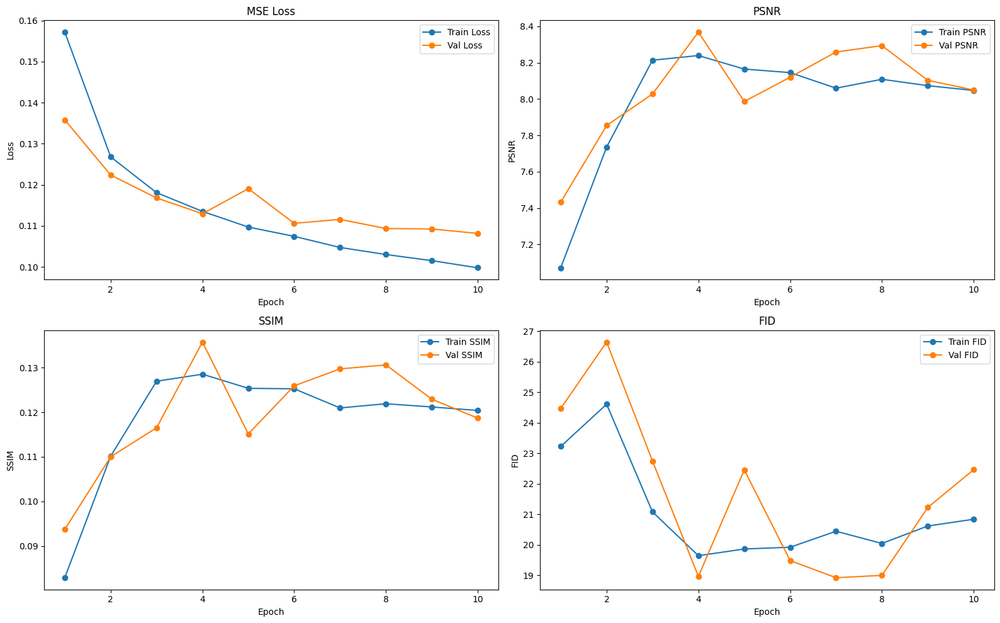

In [ ]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses)+1)
plt.figure(figsize=(16,10))

# Loss
plt.subplot(2,2,1)
plt.plot(epochs_range, train_losses, marker='o', label='Train Loss')
plt.plot(epochs_range, val_losses, marker='o', label='Val Loss')
plt.title("MSE Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# PSNR
plt.subplot(2,2,2)
plt.plot(epochs_range, train_psnrs, marker='o', label='Train PSNR')
plt.plot(epochs_range, val_psnrs, marker='o', label='Val PSNR')
plt.title("PSNR")
plt.xlabel("Epoch")
plt.ylabel("PSNR")
plt.legend()

# SSIM
plt.subplot(2,2,3)
plt.plot(epochs_range, train_ssims, marker='o', label='Train SSIM')
plt.plot(epochs_range, val_ssims, marker='o', label='Val SSIM')
plt.title("SSIM")
plt.xlabel("Epoch")
plt.ylabel("SSIM")
plt.legend()

# FID
plt.subplot(2,2,4)
plt.plot(epochs_range, train_fids, marker='o', label='Train FID')
plt.plot(epochs_range, val_fids, marker='o', label='Val FID')
plt.title("FID")
plt.xlabel("Epoch")
plt.ylabel("FID")
plt.legend()

plt.tight_layout()
plt.show()


# Save fine tuned pipeline from base pipeline and fine tuned UNet

In [ ]:
from pathlib import Path
from diffusers.utils import is_safetensors_available

# Ensure the directory exists
unet_dir = Path(INPAINT_PIPELINE_DIR) / "unet"
unet_dir.mkdir(parents=True, exist_ok=True)

# Load checkpoint UNet
best_unet_state = torch.load(inpaint_ckpt_path, map_location="cpu")

# Clean UNet keys
clean_state = {k.replace("base_model.model.", ""): v for k, v in best_unet_state.items()}

# Apply to pipeline
inpaint_base_pipe.unet.load_state_dict(clean_state, strict=False)
print("Loaded best Inpainting UNet successfully.")

# Save UNet as safetensors if available
if is_safetensors_available():
    inpaint_base_pipe.unet.save_pretrained(unet_dir, safe_serialization=True)
    print(f"Saved UNet weights as safetensors to: {unet_dir}")
else:
    # fallback to .bin
    inpaint_base_pipe.unet.save_pretrained(unet_dir)
    print(f"Safetensors not available, saved UNet as pytorch_model.bin to: {unet_dir}")

# Save full pipeline (optional)
inpaint_base_pipe.save_pretrained(INPAINT_PIPELINE_DIR)
print(f"Saved full pipeline to: {INPAINT_PIPELINE_DIR}")

Loaded best Inpainting UNet successfully.
Saved UNet weights as safetensors to: /content/drive/MyDrive/AAI-521 Final Project/fine_tuned_models/inpainting/inpainting_pipeline/unet
Saved full pipeline to: /content/drive/MyDrive/AAI-521 Final Project/fine_tuned_models/inpainting/inpainting_pipeline


In [ ]:
from tqdm import trange
import time

for i in trange(1*60, desc="Waiting 1 minute for pipeline to upload"):
    time.sleep(1)

print("15 minutes passed, continuing...")


Waiting 1 minute for pipeline to upload: 100%|██████████| 60/60 [01:00<00:00,  1.00s/it]

15 minutes passed, continuing...


# Test images with base and fine tuned model

In [7]:
# Re-Load ORIGINAL base model again (clean)
inpaint_base_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    safety_checker = None # Disabled to avoid false errors with proper usage
)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/492M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/335M [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
You have disabled the safety checker for <class 'diffusers.pipelin

In [8]:

# Load fine-tuned pipeline
ft_inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    INPAINT_PIPELINE_DIR,
    image_encoder = None, # Not available for this model
    safety_checker = None # Disabled to avoid false errors with proper usage
)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


# Test set with metrics:

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

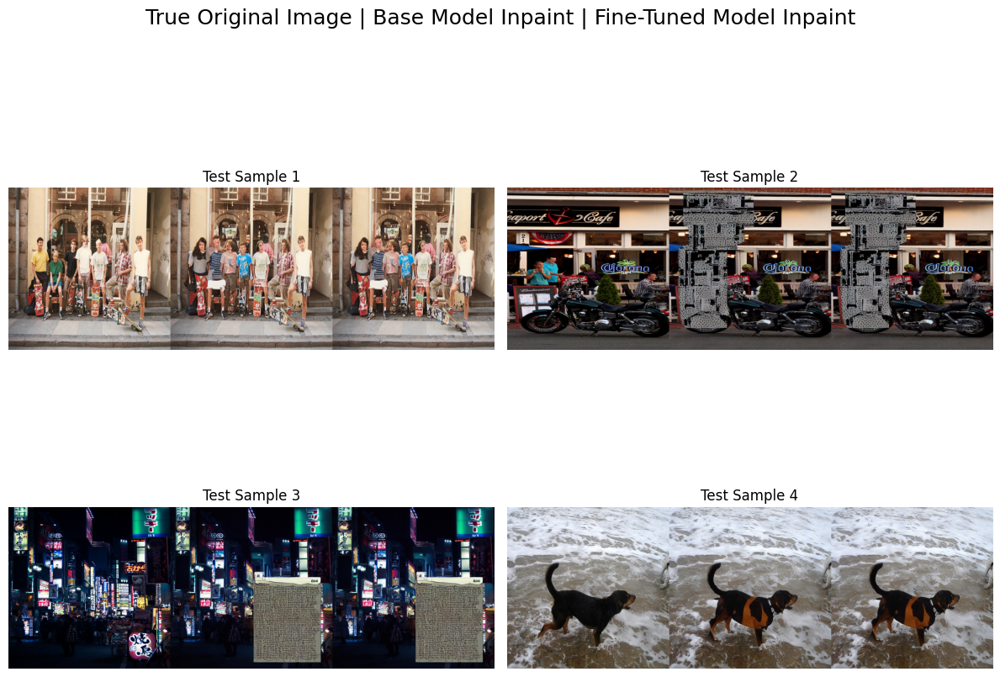


===== Inpainting Evaluation Results (4 Images per Model) =====
Base Model =>  MSE: 0.0327 | PSNR: 15.6623 | SSIM: 0.5337 | FID: 186.7641
Fine-Tuned => MSE: 0.0327 | PSNR: 15.6623 | SSIM: 0.5337 | FID: 186.7641


In [12]:
import os
import cv2
import numpy as np
import torch
from PIL import Image
from torchvision import transforms
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from torchmetrics.image.fid import FrechetInceptionDistance
import matplotlib.pyplot as plt

# --------------------------
# SETTINGS
# --------------------------
resize_shape = (512, 512)
to_tensor = transforms.ToTensor()
device = "cuda" if torch.cuda.is_available() else "cpu"

# --------------------------
# IMAGE UTILS
# --------------------------
def resize_before(pil_img):
    if pil_img.mode != "RGB":
        pil_img = pil_img.convert("RGB")
    return pil_img.resize(resize_shape)

# --------------------------
# LOAD TEST IMAGES (masked + original)
# --------------------------
test_mask_dir = os.path.join(INPAINT_SPLIT_DIRS["test"], "masked")
test_orig_dir = os.path.join(INPAINT_SPLIT_DIRS["test"], "original")
test_files = sorted(os.listdir(test_mask_dir))[:4]

dataset_masked_imgs = []
dataset_original_imgs = []
dataset_binary_masks = []

for f in test_files:
    # Load images
    orig = Image.open(os.path.join(test_orig_dir, f)).convert("RGB")
    masked = Image.open(os.path.join(test_mask_dir, f)).convert("RGB")

    orig_resized = resize_before(orig)
    masked_resized = resize_before(masked)

    dataset_original_imgs.append(orig_resized)

    # --- Create mask of differing pixels ---
    masked_arr = np.array(masked_resized)
    orig_arr = np.array(orig_resized)
    mask_arr = ((orig_arr != masked_arr).any(axis=2)).astype(np.uint8) * 255

    # --- Fill masked area with white ---
    masked_arr[mask_arr == 255] = [255, 255, 255]
    filled_masked_img = Image.fromarray(masked_arr)
    dataset_masked_imgs.append(filled_masked_img)

    # --- Convert mask to single-channel L and store ---
    binary_mask = Image.fromarray(mask_arr).convert("L")
    dataset_binary_masks.append(binary_mask)

# --------------------------
# RUN MODEL INPAINTING
# --------------------------
def run_inpaint(pipe, masked_imgs, masks):
    preds = []
    for img, mask in zip(masked_imgs, masks):
        output = pipe(
            prompt=inpaint_prompt,
            image=img,
            mask_image=mask,  # use binary mask
            generator=torch.manual_seed(42)
        ).images[0]
        preds.append(resize_before(output))
    return preds

# Base and fine-tuned models
base_predictions = run_inpaint(inpaint_base_pipe, dataset_masked_imgs, dataset_binary_masks)
ft_predictions   = run_inpaint(ft_inpaint_pipe, dataset_masked_imgs, dataset_binary_masks)

# --------------------------
# METRICS
# --------------------------
def evaluate_set(gt_imgs, pred_imgs):
    mse_scores, psnr_scores, ssim_scores = [], [], []
    for gt, pred in zip(gt_imgs, pred_imgs):
        gt_t = to_tensor(gt).unsqueeze(0).to(device)
        pred_t = to_tensor(pred).unsqueeze(0).to(device)

        # MSE
        mse_scores.append(torch.mean((gt_t - pred_t) ** 2).item())
        # PSNR
        psnr_scores.append(psnr(gt_t.cpu().numpy().squeeze().transpose(1,2,0),
                                pred_t.cpu().numpy().squeeze().transpose(1,2,0), data_range=1))
        # SSIM
        ssim_scores.append(ssim(gt_t.cpu().numpy().squeeze().transpose(1,2,0),
                                pred_t.cpu().numpy().squeeze().transpose(1,2,0),
                                channel_axis=2, data_range=1))
    return np.mean(mse_scores), np.mean(psnr_scores), np.mean(ssim_scores)

mse_base, psnr_base, ssim_base = evaluate_set(dataset_original_imgs, base_predictions)
mse_ft, psnr_ft, ssim_ft       = evaluate_set(dataset_original_imgs, ft_predictions)

# --------------------------
# FID
# --------------------------
fid_metric = FrechetInceptionDistance(feature=2048).to(device)

def compute_fid(gt_imgs, pred_imgs):
    fid_metric.reset()
    for gt, pred in zip(gt_imgs, pred_imgs):
        gt_t = torch.from_numpy(np.array(gt)).permute(2,0,1).unsqueeze(0).to(torch.uint8).to(device)
        pred_t = torch.from_numpy(np.array(pred)).permute(2,0,1).unsqueeze(0).to(torch.uint8).to(device)
        fid_metric.update(gt_t, real=True)
        fid_metric.update(pred_t, real=False)
    return fid_metric.compute().item()

fid_base = compute_fid(dataset_original_imgs, base_predictions)
fid_ft   = compute_fid(dataset_original_imgs, ft_predictions)

# --------------------------
# SIDE-BY-SIDE SUBPLOTS
# --------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle("True Original Image | Base Model Inpaint | Fine-Tuned Model Inpaint", fontsize=18, y=0.98)

positions = [(0,0), (0,1), (1,0), (1,1)]

for idx, (row, col) in enumerate(positions):
    if idx >= len(dataset_original_imgs):
        axes[row][col].axis("off")
        continue
    combined = np.hstack([
        cv2.cvtColor(np.array(dataset_original_imgs[idx]), cv2.COLOR_RGB2BGR),
        cv2.cvtColor(np.array(base_predictions[idx]), cv2.COLOR_RGB2BGR),
        cv2.cvtColor(np.array(ft_predictions[idx]), cv2.COLOR_RGB2BGR)
    ])
    axes[row][col].imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
    axes[row][col].axis("off")
    axes[row][col].set_title(f"Test Sample {idx+1}")

plt.tight_layout()
plt.show()

# --------------------------
# RESULTS OUTPUT
# --------------------------
print("\n===== Inpainting Evaluation Results (4 Images per Model) =====")
print(f"Base Model =>  MSE: {mse_base:.4f} | PSNR: {psnr_base:.4f} | SSIM: {ssim_base:.4f} | FID: {fid_base:.4f}")
print(f"Fine-Tuned => MSE: {mse_ft:.4f} | PSNR: {psnr_ft:.4f} | SSIM: {ssim_ft:.4f} | FID: {fid_ft:.4f}")
